# Group 4: Image Inpainting

 Naaman Tan (A0205299X), Chetwin Low (A0217618B), Chen Yuanbo (A0183156A)

### Setup

Additional packages

In [ ]:
!pip install easyimages
!pip install torchmetrics
!pip install sentence-transformers
!pip install lpips
!pip install tabulate
!pip install torch-scatter -f https://data.pyg.org/whl/torch-1.11.0+cu113.html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-1.11.0+cu113.html
!pip install torch-geometric

Imports

In [2]:
# functional
import os
import sys
import time
import glob
import zipfile
import pickle

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import torchvision.utils as vutils

import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from natsort import natsorted
from numba import prange

# visualization
import matplotlib.pyplot as plt
%matplotlib inline
from tabulate import tabulate

# images
from skimage import io
from skimage import transform
from PIL import Image

# metrics
import torchmetrics
import lpips

Data folders and paths

In [3]:
DATA_ROOT = 'data'
DATA_FOLDER = 'frog_images'

DATASET_PATH = os.path.join(DATA_ROOT, DATA_FOLDER)
os.makedirs(DATASET_PATH, exist_ok=True)

PREPROCESSED_FOLDER = os.path.join(DATA_ROOT, "preprocessed")
os.makedirs(PREPROCESSED_FOLDER, exist_ok=True)

MODEL_WEIGHTS_PATH = 'model_weights'
os.makedirs(MODEL_WEIGHTS_PATH, exist_ok=True)

GPU Setup

In [4]:
device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda")

### Abstract

We present our investigation of several image inpainting techniques on small, simple images from a custom dataset of frog images in nature. Despite its useful applications in digital art and image restoration, image inpainting is a non-trivial computer vision task as it is inherently ill-posed, as every masked image _x_ can be mapped to a _set_ of plausible images _Y_. We construct a dataset of frog images pulled and cleaned from _iNaturalist_, a crowdsourced species identification system, consisting of 10,000 images for training, 1,000 for validation and 517 for testing. An exploration of baseline generative models from vanilla Convolutional Neural Networks (CNN) to Generative Adversarial Networks (GAN) is conducted. With those insights and a review of the literature, we then propose several improvements to the baselines and explore their effectiveness. In particular, we examine the use of dilated convolutions, local, global and patch discrimination, multi-task learning, graph neural networks and contrastive learning with siamese neural architectures. 

Over a simple set of experiments, we show that we can achieve quantitatively and qualitatively good results on our difficult dataset, and posit reasonable hypotheses where we fail to.



### Overview of the notebook



This notebook details the more theoretical aspects and high-level implementation details of all our experiments and the analysis of results. For full implemetation details, refer to the specific notebooks.

This notebook is organized as follows: 
1. Introduction
2. Data Collection, Exploration and Cleaning 
3. Data Preprocessing and Augmentation
4. Data Analysis with Deep Learning
5. Conclusions

## 1. Introduction: image inpainting

Image inpainting refers to the repair of missing parts of an image, given one that is damaged or incomplete. Since the mapping between input and output images is inherently ill-posed given that many realistic and semantically possible solutions exist, image inpainting is a non-trivial problem and an active area of research [1]. Specifically, inpainting can be formulated as a conditional image generation problem, where a model takes as input a damaged image and outputs an image that is visually and semantically plausible image that is consistent with the input. The dominant approaches in image inpainting is to utilise Generative Adversarial Networks (GAN) or Variational Autoencoders (VAE) [2], or their variants.

Mathematically, the image inpainting task can be expressed at the level of sets: we are given one set of images in domain $ X $ and a different set in domain $ Y $ and can train a mapping $ f: X → Y $ such that the output images are indistinguishable from known images from the target distribution Y. We therefore seek to explore image-generation techniques that can learn to translate between domains, with the assumption that there is some underlying relationship between the domains. For example, that they are two different and reasonable renderings of the same underlying scene - and we explore techniques that can learn that relationship. 

In this project we aim to tackle the problem of image inpainting by building and training models that generate images that are realistic and consistent with respect to the damaged input images.

We can define the training task by the input, output and loss. In general, our model takes as input an image that has random parts of it removed, reconstructs an image, and is penalised by some notion of reconstruction loss in terms of similarity to the ground truth image (e.g. L1 or L2 loss). The exact loss function will depend on model architecture (e.g. GANs’ adversarial loss) and downstream decisions, which we describe in detail in later sections.


## 2. Data Collection, Exploration and Cleaning

### 2.1 iNaturalist

iNaturalist [3] is an online social network that is also a crowdsourced species identification system and organism occurence recording tool. The total collection of verified images includes 91 million observations of 344 thousand species. The [iNaturalist website](https://www.inaturalist.org/home) also provides an API service that allows for the exporting of image metadata and download links as a csv file.

#### Choice of frogs

An initial set of three animals were chosen (frogs, birds, and deers) to construct a dataset for the sake of diversity. However, preliminary dataset visualization revealed that the images of birds and deers (and other similarly mobile animals) are quite noisy as:

1. A substantial portion of the images under these categories are of non-animal objects such as feathers, eggs, deer hoof tracks, deer faeces etc.  This is likely because iNaturalist is used for species identification and conservation efforts, including environment tagging.

2. A substantial portion of images captured are such that the animal in question takes up only a small portion of the image (especially for birds) or are blurry since the images are captured while the animal is in motion. This is likely because it is difficult to capture images of birds and deers up close since they can escape easily. 

We observed that this is not the case for images of frogs: the collected images are often taken with the frog directly in the center and up close. We hypothesize that this is due to the following reasons:

1. Frogs are small animals so their tracks are more difficult to identify.
2. Frogs are more easily captured by hand and photographed up close. Indeed, a large portion of frogs images depict the animal held up by a person's hands.

Moreover, there is still a wide variety of different species of frogs, which gives our dataset diversity. So we direct our focus towards a dataset of frogs.

With this preliminary analysis, we retrieved near 200,000 research grade (categorized by iNaturalist) frog images using their API to form our initial uncleaned dataset. We provide our downloaded csv file here for convenience.

Note that the following command might take a few tries to succeed.

In [5]:
# gdrive link: https://drive.google.com/file/d/1V_UP_MQfTVaiKS0h48QNUiNOv8VgIR-w/view?usp=sharing

file_id = '1V_UP_MQfTVaiKS0h48QNUiNOv8VgIR-w'
file_name = 'frogs_metadata.csv'
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={file_id}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={file_id}" -O {file_name} && rm -rf /tmp/cookies.txt

--2022-04-27 15:18:11--  https://docs.google.com/uc?export=download&confirm=&id=1V_UP_MQfTVaiKS0h48QNUiNOv8VgIR-w
Resolving docs.google.com (docs.google.com)... 142.251.8.100, 142.251.8.139, 142.251.8.138, ...
Connecting to docs.google.com (docs.google.com)|142.251.8.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/422v9p1em0h5p97rcqjd0ke0uqsagvr9/1651072650000/04490789293409028596/*/1V_UP_MQfTVaiKS0h48QNUiNOv8VgIR-w?e=download [following]
--2022-04-27 15:18:15--  https://doc-0g-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/422v9p1em0h5p97rcqjd0ke0uqsagvr9/1651072650000/04490789293409028596/*/1V_UP_MQfTVaiKS0h48QNUiNOv8VgIR-w?e=download
Resolving doc-0g-54-docs.googleusercontent.com (doc-0g-54-docs.googleusercontent.com)... 108.177.125.132, 2404:6800:4008:c01::84
Connecting to doc-0g-54-docs.googleusercontent.com (doc-0g-54-doc

#### 2.1.1 Visualize some images

Here we perform some simple cleaning to remove invalid urls, duplicated urls and gifs.

In [6]:
frogs_df = pd.read_csv("frogs_metadata.csv", sep=",")

# remove invalid and duplicate urls
frogs_df = frogs_df.dropna(subset=['image_url']).drop_duplicates(subset=['image_url'])

# remove non-image types e.g. .gif files
frogs_filetype = frogs_df['image_url'].apply(lambda x: os.path.splitext(x)[1]).unique()
print(f"Image file extensions are {frogs_filetype}")
print("Removing .fig files...")
frogs_df = frogs_df[~(frogs_df['image_url'].apply(lambda x: os.path.splitext(x)[1]).isin(['.gif']))]
frogs_filetype = frogs_df['image_url'].apply(lambda x: os.path.splitext(x)[1]).unique()
print(f"Done. Image file extensions are {frogs_filetype}")

print(f"Total frogs instances: {len(frogs_df)}")
frogs_df.head()

Image file extensions are ['.jpg' '.jpeg' '.png' '.gif']
Removing .fig files...
Done. Image file extensions are ['.jpg' '.jpeg' '.png']
Total frogs instances: 186902


,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,...,geoprivacy,taxon_geoprivacy,coordinates_obscured,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id
0,73992831,Thu Apr 15 2021 07:10:05 GMT+0900 (GMT+9),2021-04-15,2021-04-14 22:10:05 UTC,Tokyo,460572,norio_nomura,2021-04-14 23:15:23 UTC,2021-04-28 12:19:04 UTC,research,...,NaN,open,False,NaN,NaN,ニホンアマガエル,Hyla japonica,Japanese Tree Frog,Amphibia,23951
1,73992869,Thu Apr 15 2021 07:16:24 GMT+0900 (GMT+9),2021-04-15,2021-04-14 22:16:24 UTC,Tokyo,460572,norio_nomura,2021-04-14 23:15:42 UTC,2021-04-28 05:38:57 UTC,research,...,NaN,open,False,NaN,NaN,Japanese Tree Frog,Hyla japonica,Japanese Tree Frog,Amphibia,23951
2,73999658,2021/04/15 10:04 AM AEST,2021-04-15,2021-04-15 00:04:00 UTC,Brisbane,1771883,graham_winterflood,2021-04-15 00:34:04 UTC,2022-02-04 13:11:14 UTC,research,...,NaN,open,False,NaN,NaN,White-lipped Tree Frog,Nyctimystes infrafrenatus,White-lipped Tree Frog,Amphibia,517066
3,74005755,Thu Apr 15 2021 07:08:31 GMT+1000 (GMT+10),2021-04-15,2021-04-14 21:08:31 UTC,Brisbane,2579853,megahertzia,2021-04-15 01:53:49 UTC,2022-01-04 06:01:13 UTC,research,...,NaN,open,False,NaN,NaN,Desert Tree Frog,Litoria rubella,Desert Tree Frog,Amphibia,23611
4,74006270,2021-04-15 10:38:32 AM GMT+10:00,2021-04-15,2021-04-15 00:38:32 UTC,Brisbane,2235434,kimradnell,2021-04-15 02:01:22 UTC,2021-04-15 13:03:12 UTC,research,...,NaN,open,False,gps,gps,Eastern Dwarf Tree Frog,Litoria fallax,Eastern Dwarf Tree Frog,Amphibia,23656


Let's take a look at what the images are like.

In [7]:
from easyimages import EasyImageList

def visualize_images_from_df(df, samples = 128):
    """
    This method takes in a dataframe containing links to the image
    and the source and visualizes them. The required keys are:
        * "image_url" -> url where image can be pulled from
        * "url" -> url of the sample
    """
    urls = df['image_url'].tolist()
    observation_urls = df['url'].tolist()
    easy_list = EasyImageList.from_list_of_urls(urls, lazy = True)
    
    # Add observation url into label, which is displayed as alt text
    for i in prange(len(easy_list)):
        easy_list[i].label = observation_urls[i]
        
    _ = easy_list.visualize_grid_html(np.random.choice(easy_list.images, min(len(easy_list), samples), replace = False))

In [8]:
visualize_images_from_df(frogs_df, samples=32)

### 2.2 Parsing csv metadata to filter irrelevant images

The metadata file contains a number of useful fields in addition to the url that allows us to gain a better understanding of the distribution of our dataset and aids us in the data cleaning process. 

In [9]:
print("Columns are: \n", frogs_df.columns)

Columns are: 
 Index(['id', 'observed_on_string', 'observed_on', 'time_observed_at',
       'time_zone', 'user_id', 'user_login', 'created_at', 'updated_at',
       'quality_grade', 'license', 'url', 'image_url', 'sound_url', 'tag_list',
       'description', 'num_identification_agreements',
       'num_identification_disagreements', 'captive_cultivated',
       'oauth_application_id', 'place_guess', 'latitude', 'longitude',
       'positional_accuracy', 'private_place_guess', 'private_latitude',
       'private_longitude', 'public_positional_accuracy', 'geoprivacy',
       'taxon_geoprivacy', 'coordinates_obscured', 'positioning_method',
       'positioning_device', 'species_guess', 'scientific_name', 'common_name',
       'iconic_taxon_name', 'taxon_id'],
      dtype='object')


#### 2.2.1 Filtering by description

We observe that while _less_ noisy as compared with the birds and deers categories, the frog images also contain noisy images such as dead (deformed) frogs, tadpoles etc. 

To clean these manually would be intractable, so we instead filter the images by their `description` field with a blacklist of words. 

<p align="center">
  <img src="https://i.ibb.co/Cs6jp7H/description-field.png" />
</p>
<center><i> Description field of an observation page.</i></center>




##### 2.2.1.1 Getting images with description fields 

First, we remove instances with empty `description` fields. This reduces our dataset to around 21,000. Although this removes a large number of instances, doing so gives us greater control over the cleanliness of our dataset.

In [10]:
frogs_df = frogs_df.dropna(subset=['description'])
print(f"Total frogs instances: {len(frogs_df)}")

Total frogs instances: 20964


##### 2.2.1.2 Generate blacklist of words using SentenceTransformers

To construct this blacklist, we utilze the concept of word-to-vec and retrieve top-k similar words from a pool of words a using list of seed words (e.g. dead, tadpole). The list of seed words is constructed by observation, and the word pool is constructed by taking the unique set of words from the `description` field of our entire dataset.

In [11]:
seed_words = ['dead','spawn','egg','tadpole','nest','brood']

all_words = frogs_df['description'].str.lower().str.findall("\w+")
word_pool = set()
for l in all_words:
    word_pool.update(l)
word_pool = list(word_pool)
print("Number of unique words:", len(word_pool))

Number of unique words: 19390


We use SentenceTransformer [10] implemented in the [sentence-transformers](https://www.sbert.net) library to compute the word embeddings of both the seed words and the word pool.

In [12]:
from sentence_transformers import SentenceTransformer

def retrieve_word_embeddings(words: list):
    model = SentenceTransformer('all-MiniLM-L6-v2')
    embeddings = model.encode(words, convert_to_tensor = True)
    return embeddings

In [13]:
pool_embeddings = retrieve_word_embeddings(word_pool)
seed_embeddings = retrieve_word_embeddings(seed_words)

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Batches:   0%|          | 0/606 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

The top-k similar words are computed using cosine-similarity. We choose k=20 and only take words with a similarity score > 0.75.

In [14]:
from sklearn.metrics.pairwise import cosine_similarity

def compute_similarity_score(seed_embeddings: list, all_embeddings: list) -> list:
    """
    Takes in a [n x d] list of seed_embeddings, and for each one, computes a similarity score
    with all embeddings in the list of all_embeddings [w x d] to get an output of [n x w].
    """
    scores = cosine_similarity(seed_embeddings.cpu(), all_embeddings.cpu())
    return scores

def print_topk_words(query_words: list, scores: list, key_words: list, k = 10, threshold = 0.5):
    """
    Takes in a n x w list of scores, and a list of w words, and finds the top k 
    similar words for each of the n words.
    """
    indices = np.argpartition(scores, -k)[:,-k:] # sort then take top k, for each word
    topk_words = np.take(np.array(key_words), indices)
    topk_scores = scores[np.arange(scores.shape[0])[:, None], indices]

    # print top k word, score for each word
    out_list = []
    for i, row in enumerate(range(topk_words.shape[0])):
        print(f"Word {i+1}: {query_words[i]}")
        sorted_list = sorted(list(zip(topk_words[row], topk_scores[row])), key=lambda t: t[1], reverse=True)
        for word, score in sorted_list:
            print("[{:.5f}] - {}".format(score, word))
        print()

        out_list.extend(list(filter(lambda wordscore : wordscore[1] > threshold, sorted_list)))

    return out_list

In [15]:
scores = compute_similarity_score(seed_embeddings, pool_embeddings)
sorted_word_list = print_topk_words(
    query_words=seed_words, 
    scores=scores, 
    key_words=word_pool, 
    k=20, 
    threshold=0.75
)

Word 1: dead
[1.00000] - dead
[0.80403] - deceased
[0.77241] - died
[0.76030] - killed
[0.73658] - alive
[0.73513] - dies
[0.71715] - death
[0.70166] - lifeless
[0.68499] - die
[0.66718] - dying
[0.61315] - killing
[0.60743] - lives
[0.60378] - buried
[0.59865] - demise
[0.59791] - revive
[0.59344] - kill
[0.58953] - funeral
[0.58488] - lived
[0.56652] - living
[0.55951] - live

Word 2: spawn
[1.00000] - spawn
[0.85648] - spawning
[0.85346] - spawned
[0.53511] - create
[0.53016] - emerge
[0.50725] - nests
[0.50455] - brood
[0.49718] - frogspawn
[0.49277] - reproduce
[0.48962] - nest
[0.48770] - populated
[0.48687] - creating
[0.47871] - emergent
[0.47714] - generated
[0.47676] - reproduction
[0.47652] - emergents
[0.47547] - swarming
[0.47353] - swarm
[0.47271] - feeder
[0.47156] - generates

Word 3: egg
[1.00000] - egg
[0.91208] - eggs
[0.59261] - chicken
[0.56301] - chickens
[0.55842] - breeding
[0.55607] - hatchling
[0.55018] - duck
[0.54832] - feathers
[0.54711] - hatching
[0.54572

In [16]:
blacklist = set()
blacklist.update(list(map(lambda wordscore : wordscore[0], sorted_word_list)))
print("Blacklisted words are:\n\t{}".format('\n\t'.join(blacklist)))
print("No. words:", len(blacklist))

Blacklisted words are:
	spawned
	eggs
	neste
	dead
	tadpolee
	nests
	killed
	nest
	nesters
	died
	brood
	deceased
	nesting
	tadpoles
	spawning
	tadpole
	egg
	spawn
No. words: 18


Here we can visualize the images with the blacklisted words. Many of them do indeed contain the blacklisted word, though some do not.

In [ ]:
for word in blacklist:
    df_word = frogs_df[frogs_df['description'].str.lower().str.contains(word)]
    print(f"For {word}, {len(df_word)} samples.")
    visualize_images_from_df(df_word, 16)
    print('\n')

For eggs, 165 samples.


For neste, 2 samples.


For tadpole, 325 samples.


For nest, 37 samples.


For dead, 301 samples.


For nesters, 1 samples.


For nesting, 2 samples.


For spawn, 65 samples.


For egg, 278 samples.


For deceased, 25 samples.


For brood, 1 samples.


For spawning, 5 samples.


For spawned, 1 samples.


For nests, 3 samples.


For killed, 16 samples.


For tadpolee, 1 samples.


For died, 22 samples.


For tadpoles, 222 samples.


Then, we remove the images. We have about 20,000 images left after.

In [17]:
frogs_df = frogs_df[~(frogs_df['description'].str.lower().isin(blacklist))]
print("Number after removing:", len(frogs_df))

Number after removing: 20898


#### 2.2.2 Frog species distribution

Furthermore, since iNaturalist is not a curated data source but a crowd-sourced initiative by the public, not all frog species are well observed and documented in iNaturalist. This means that there a number of frog species that are under-represented with very little image observations. This creates an imbalance in the classes of our dataset, which does not benefit our model's learning. We look at the `common_name` field of the dataset to explore the distribution of frog species in our dataset.

Plotting the histogram of species count, we find that most species have less than 150 images in them.

In [18]:
# Show species histogram
freq = frogs_df["common_name"].value_counts()
counts, edges, _ = plt.hist(freq, bins=10)
plt.title("Histogram of species counts")
plt.xlabel('Number of images in species (counts)')
plt.ylabel('Frequency')
plt.show()
print(f"Number of species in first bin (with count < {round(edges[1])}): {int(counts[0])} ({round(counts[0] / counts.sum(),2)*100}%)")

Number of species in first bin (with count < 134): 858 (96.0%)


With a threshold of minimum of 150 images per species, we end up with 31 species and around 13,000 images remaining.

In [19]:
def groupby_plot_hist(df, column_name, count_threshold = 100):
    frequent = df[column_name].value_counts()
    thres_counts = frequent[frequent > count_threshold]
    thres_counts.plot(kind = "bar")
    print(thres_counts)
    print(len(thres_counts), f"species above threshold of {count_threshold}. Total is", thres_counts.sum())
    plt.show()

In [20]:
count_threshold = 150
column_name = "common_name"
groupby_plot_hist(frogs_df, column_name, count_threshold = count_threshold)

American Toad                 1328
American Bullfrog             1189
Green Frog                    1097
Gulf Coast Toad                897
Green Treefrog                 649
European Common Frog           559
European Toad                  542
Wood Frog                      529
Western Leopard Toad           496
Northern Leopard Frog          463
Spring Peeper                  390
Cuban Tree Frog                379
Gray Treefrog                  371
Northern Pacific Tree Frog     358
Western Toad                   355
Gray Treefrog Complex          290
Southern Toad                  277
Cane Toad                      265
Asian Common Toad              260
Southern Leopard Frog          248
Pickerel Frog                  242
Blanchard's Cricket Frog       239
Fowler's Toad                  195
Squirrel Tree Frog             194
Sierran Tree Frog              194
Giant Toad                     192
Clicking Stream Frog           190
Woodhouse's Toad               189
Australian Green Tre

#### 2.2.3 Location distribution

Additionally, similar to the notion of species causing feature differences and problems with class underrepresentation, we consider the idea that images captured in different locations may have different environments, even if the species are the same. For that reason, using time zone as a proxy for location, we consider the distribution of images across time zones. 

Observe that most time zones have at least a 150 images as well.

In [21]:
# Show timezone histogram
freq = frogs_df["time_zone"].value_counts()
counts, edges, _ = plt.hist(freq, bins=10)
plt.title("Histogram of time zones")
plt.xlabel('Number of images in time zone (counts)')
plt.ylabel('Frequency')
plt.show()
print(f"Number of time zones in first bin (with count < {round(edges[1])}): {int(counts[0])} ({round(counts[0] / counts.sum(),2)*100}%)")

Number of time zones in first bin (with count < 596): 115 (94.0%)


In [22]:
count_threshold = 150
column_name = "time_zone"
groupby_plot_hist(frogs_df, column_name, count_threshold = count_threshold)

Eastern Time (US & Canada)     5956
Central Time (US & Canada)     2891
UTC                            2688
Pacific Time (US & Canada)     1911
Pretoria                       1338
Brisbane                        617
Mountain Time (US & Canada)     607
Sydney                          399
Rome                            340
Paris                           333
Hawaii                          327
Atlantic Time (Canada)          234
Jakarta                         219
Mexico City                     208
Taipei                          190
Bogota                          188
Brasilia                        159
Name: time_zone, dtype: int64
17 species above threshold of 150. Total is 18605


#### 2.2.3 Filter under-represented species and locations

In [23]:
def filter_by_threshold_counts(df, column_names: list, count_threshold = 100):
    out_df = df
    prev_size = len(df)
    redo = True
    while redo:
        for column in column_names:
            out_df = out_df[out_df.groupby(column)[column].transform("size") > count_threshold]
            if len(out_df) < prev_size: # had change, need to recheck previous
                prev_size = len(out_df)
                redo = True
                continue
            redo = False

    print("After filtering, left with", len(out_df), "samples.")
    return out_df

After removal of these underrepresented samples, we have about 11,000 samples left.

In [24]:
count_threshold = 150
column_names = ['common_name', 'time_zone']
frogs_df = filter_by_threshold_counts(frogs_df, column_names, count_threshold)

After filtering, left with 11517 samples.


<a name="download_dataset"></a>
### 2.3 Final visualization and download dataset

In [ ]:
visualize_images_from_df(frogs_df, samples=32)

Here we download images from the filtered dataframe. The `id` in the metadata is uniquely tied to each image, so we use it to name and identify each image of our downloaded dataset.

In [ ]:
import ntpath
import requests
from multiprocessing import Pool
from functools import partial

def download_image(id_url: tuple, save_dir: str):

    EXTENSIONS = [".jpeg", ".png", ".jpg"]

    try:
        idx, img_url = id_url
        
        # check if exists
        exists = [os.path.join(save_dir, "frogs_" + str(idx) + ext) for ext in EXTENSIONS]
        exists = list(filter(lambda file : os.path.exists(file), exists))
        if len(exists) > 0: # exists
            return

        # get file
        img_bytes = requests.get(img_url).content
        _, file_name = ntpath.split(img_url)
        file_id, file_ext = os.path.splitext(file_name)

        # name
        FILENAME = "frogs_" + str(idx) + file_ext
        SAVE_PATH = os.path.join(save_dir, FILENAME)

        # save
        with open(SAVE_PATH, 'wb') as img_file:
            img_file.write(img_bytes)
            print(f'\r{FILENAME} was downloaded...', end = '', flush = True)
    except Exception as e:
        print(e)

def download_dataset_from_df(df, save_path):
    frogs_id_url_df = df[['id', 'image_url']]
    id_url_list = frogs_id_url_df.apply(lambda row : (row["id"], row["image_url"]), axis = 1).values

    with Pool(10) as p:
        p.map(partial(download_image, save_dir=save_path), id_url_list)
    
    print(f"Finished downloading {len(id_url_list)} images.")

The code block below downloads the images from the links provided by the filtered dataframe `frogs_df`. For convenience, we also provide a zipped version of our dataset which can be downloaded with the code block that follows after. The zip files also contain the respective train, validation, and test splits that we use for our experiments

In [ ]:
# download_dataset_from_df(frogs_df, dataset_path)

(Recommended) We download the zipped dataset directly. Note that the following command might take a few tries to succeed. Time taken to download is less than a minute. Unzipping the dataset might take awhile (<3 mins).

In [25]:
# Gdrive link: https://drive.google.com/file/d/16sdPg_iXsDAWR_mPcpodhaxu9hRdEaXT/view?usp=sharing

file_id = '16sdPg_iXsDAWR_mPcpodhaxu9hRdEaXT'
file_name = "frogs_dataset.zip"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={file_id}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={file_id}" -O {file_name} && rm -rf /tmp/cookies.txt

# Unzip dataset
if os.path.exists(file_name):
    with zipfile.ZipFile(file_name, 'r') as ziphandler:
        ziphandler.extractall(DATA_ROOT)
    data_len = len(glob.glob(os.path.join(DATASET_PATH, '*')))
    print(f"Successfully downloaded and unzipped {data_len} images.")
else:
    print("Zip file was not downloaded successfully! Please run the code block again.")

--2022-04-27 15:21:24--  https://docs.google.com/uc?export=download&confirm=t&id=16sdPg_iXsDAWR_mPcpodhaxu9hRdEaXT
Resolving docs.google.com (docs.google.com)... 142.251.8.100, 142.251.8.101, 142.251.8.113, ...
Connecting to docs.google.com (docs.google.com)|142.251.8.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/he4pffj9a6v0li1jma4k8qit4a1l4e5a/1651072875000/04490789293409028596/*/16sdPg_iXsDAWR_mPcpodhaxu9hRdEaXT?e=download [following]
--2022-04-27 15:21:24--  https://doc-10-54-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/he4pffj9a6v0li1jma4k8qit4a1l4e5a/1651072875000/04490789293409028596/*/16sdPg_iXsDAWR_mPcpodhaxu9hRdEaXT?e=download
Resolving doc-10-54-docs.googleusercontent.com (doc-10-54-docs.googleusercontent.com)... 108.177.125.132, 2404:6800:4008:c01::84
Connecting to doc-10-54-docs.googleusercontent.com (doc-10-54-do

### 2.4 Train-val-test split

**Note that our train, validation, and test splits are downloaded together with the zipped dataset in [section 2.3](#download_dataset)**

We then split dataset into train, validation, and test sets using the `id`. We choose split sizes of:
- Train set: 10,000 images
- Validation set: 1000 images
- Test set: 517 images

In [26]:
from sklearn.model_selection import train_test_split

frogs_ids = frogs_df['id'].tolist()
train_val, test = train_test_split(frogs_ids, test_size=517)
train, val = train_test_split(train_val, test_size=1000)

print(f"Length of train split: {len(train)}")
print(f"Length of validation split: {len(val)}")
print(f"Length of test split: {len(test)}")

Length of train split: 10000
Length of validation split: 1000
Length of test split: 517


Here we save the splits into text files. We also provide our train, validation, and test splits for convenience and reproducibility. They were downloaded together with the frogs dataset zip file in [section 2.3](#download_dataset)

In [ ]:
# with open("frogs_train.txt", "w") as f:
#     for i in train:
#         f.write(f"{i}\n")
# with open("frogs_val.txt", "w") as f:
#     for i in val:
#         f.write(f"{i}\n")
# with open("frogs_test.txt", "w") as f:
#     for i in test:
#         f.write(f"{i}\n")

## 3. Data Preprocessing and Augmentation

### Using `torch.data.utils.Dataset`
To prepare our now cleaned dataset for training, we first preprocess the images into a standardized format as input to our deep learning models. We use the `torch.data.utils.Dataset` API to support our data preprocessing and loading, by defining a `AnimalDataset` class. Note that we have defined fuctionality to save and load the images from a `.pkl` file dynamically, to prevent repeated computation of preprocessing steps.

### Aspect ratio of images
We want our preprocessed images to be square and have the same size while preserving image aspect ratio. This can be represented in a simple 2-step process:
1. Identify the shorter edge and resize the image while preserving aspect ratio such that the shorter edge is our desired length. E.g. If target image size is $H \times W = 64 \times 64$, an image of $1024 \times 512$ will be resized to $128 \times 64$, and an image of $128 \times 192$ will be resized to $64 \times 96$. Resizing is done via bilinear interpolation.
2. In the longer dimension, take the center square crop, which yields a square cropped image of the target size specifications.

This is done dynamically in our dataset (`AnimalDataset` class defined below) in the `_preprocess_aspectratio` function. We chose to do this operation dynamically since we want to have the option of experimenting with different image dimensions given the constraints on our resources (number of GPUs, time taken to train models etc.). To reduce redundant preprocessing of the images during model training, we save the preprocessed images to pickle files in the first training epoch so that they can be directly loaded in the subsequent epochs. This is done in the `_getsample_loadsave` and `_getsample_local` functions of our dataset class.

### Generating masks 

In the most basic version of the image inpainting task, the training data consists of 2 sets of images:
1. A set of damaged images with missing pixels that is fed into the model, and
2. The corresponding original set of images which is used as the ground truth (with respect to the damaged images).

To create this training data, we dynamically "damage" the preprocessed images by masking out portions of the image pixels using random-sized rectangular crops. We fix the maximum and minimum crop length to (1/4, 1/6) the length of each side of the preprocessed image.

This step is achieved in the `_damage` function of `AnimalDataset`. Since this step is dynamic and random, the generated damaged images are different across epochs even if the ground truth images are the same. Thus, this also serves as a data augmentation step for training pipeline. Note that only the image damaging step is random. The image preprocessing step is deterministic and preprocessed images remain the same across all training runs that utilize the same image sizes. In addition, we also cocatenate the mask to the damaged image to provide more information to the model about which pixels are missing.

### 3.1 Define dataset class

In [27]:
# functional
import cv2
import pandas as pd
import PIL.Image
import numpy as np
import os
import time
import torch

from numba import prange
from skimage import io
from skimage import transform
from torch.utils.data import Dataset


# pickle
import pickle

class AnimalDataset(Dataset):
    """
    Custom Animal Dataset.
    """

    def __init__(self, 
                 index_file_path: str, 
                 root_dir_path: str, 
                 file_prefix : str,
                 image_dimension: int, 
                 local_dir_path: str = None, 
                 transform = None,
                 concat_mask = True,
                 random_noise = True,
                 require_init = True,
                 drops = None,
                 center_mask = False,
                 divide_range = (4,6), 
                 file_postfix = [".png", ".jpg", ".jpeg"]):
        """
        Args:
            index_file_path: Path to the file with indices
            root_dir_path:   Directory with the images
            transform:       Callable that transforms sample
        """

        # save other attributes
        self.root_dir_path = root_dir_path
        self.transform = transform
        self.local_dir_path = local_dir_path
        self.IM_DIMENSIONS = image_dimension
        self.CONCAT_MASK = concat_mask
        self.FILE_PREFIX = file_prefix
        self.INITIALIZED = False
        self.REQUIRE_INIT = require_init
        self.RANDOM_NOISE = random_noise
        self.RNG = np.random.RandomState(10)
        self.CENTER_MASK = center_mask

        # constants
        AnimalDataset.CROP_BOX_SIZES_DIVIDE_RANGE = divide_range
        AnimalDataset.FILE_POSTFIX = file_postfix


        # load file indices, then transform each index to one possibility for each postfix
        self.df_indices = pd.read_csv(index_file_path, usecols = [0], header = 0) # select first column, which should be index
        if drops is not None:
            self.df_indices = self.df_indices.drop(drops, inplace = False)
        
        # get file names
        self.df_filenames = self.df_indices.apply(
            lambda x : [self.FILE_PREFIX + str(int(x)).strip() + postfix for postfix in AnimalDataset.FILE_POSTFIX], 
            axis = 1)  


                
    def _clean(self, verbose = True):
        """
        This is a helper method that clears the text file of corrupted files at startup. 
        Used as a defensive method of ensuring dataset is clean.
        """

        corrupted = []
        start = time.time()
        print("Cleaning ...")

        for idx in prange(len(self.df_filenames)):
            filenames = self.df_filenames.iloc[idx]
            for f in filenames:
                try: 
                    image_name = os.path.join(self.root_dir_path, f)
                    image = io.imread(image_name)   
                
                    # if 4 channels and png, then RGBA -> convert
                    if image.shape[-1] == 4:
                        rgba_image = PIL.Image.open(image_name)
                        image = np.array(rgba_image.convert('RGB'))

                    # sanity check that is an RGB image
                    h, w, c = image.shape
                    assert(c == 3)

                except FileNotFoundError:
                    continue

                except AttributeError: # NoneType -> corrupted file
                    corrupted.append(idx) 

                except: # no idea why it fails, catch all, just remove
                    corrupted.append(idx) 


        # at the end, drop all corrupted rows from df_indices 
        self.df_indices = self.df_indices.drop(corrupted, inplace = False)

        # reload filenames
        self.df_filenames = self.df_indices.apply(
            lambda x : [self.FILE_PREFIX + str(int(x) + 1).strip() + postfix for postfix in AnimalDataset.FILE_POSTFIX], 
            axis = 1)   

        print(f"Cleaning completed. Dropped {len(corrupted)} files. Took {(time.time() - start)/60} min")
        if verbose:
            print(f"The row indices dropped were {corrupted}")
    
    def __len__(self):
        return len(self.df_indices)

    def __getitem__(self, idx):
        """
        Gets a sample.
        """
        if not self.INITIALIZED and self.REQUIRE_INIT:
            print("Not initialized! Please call AnimalDataset::initialize()!")

        assert(self.INITIALIZED or not self.REQUIRE_INIT)

        if torch.is_tensor(idx):
            idx = idx.tolist()

        # retrieve preloaded
        if self.local_dir_path != None:
            try: 
                # load from memory
                sample = self._getsample_local(idx, self.CONCAT_MASK, self.RANDOM_NOISE)
                return sample

            except FileNotFoundError:
                pass

        # no preloaded, preprocess and save
        return self._getsample_loadsave(idx, self.CONCAT_MASK, self.RANDOM_NOISE)

    def initialize(self):
        self._clean()
        self.INITIALIZED = True


    def _getsample_local(self, idx, concat_mask = False, random_noise = False):
        """
        Gets an image stored locally and then processes it into 
        a sample.
        """

        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # load image from local
        filename = os.path.join(self.local_dir_path, str(int(self.df_indices.iloc[idx])).strip())
        with open(f"{filename}.pickle", "rb") as p:
            image = pickle.load(p)

        with open(f"{filename}.pickle", "rb") as p:
            damaged_image = pickle.load(p)

        with open(f"{filename}.pickle", "rb") as p:
            gray = pickle.load(p)

        # dynamically damage
        damaged_image, mask = self._damage(damaged_image, random_noise)

        # optionally append mask to damaged image
        if concat_mask:
            damaged_image = torch.cat([damaged_image, mask], dim = -1)

        # grayscale
        gray = self._gray(gray)
                
        # return sample as tuples of (tensor, tensor)
        sample = {"image": damaged_image, "reconstructed" : image, "mask" : mask, "gray" : gray}

        # transform if defined as in normal Dataset class
        if self.transform:
            sample = self.transform(sample)

        return sample
        

    def _getsample_loadsave(self, idx, concat_mask = False, random_noise = False):
        """
        Gets a sample from memory, preprocesses it for aspect ratio, then 
        processes it into a sample.
        """
        if torch.is_tensor(idx):
            idx = idx.tolist()
               
        # load pair
        damaged_image, image = self._load_image_pair(self.df_filenames.iloc[idx])
        damaged_image, mask = self._damage(damaged_image, random_noise)
        gray = self._gray(image)
        
        # optionally append mask to damaged image
        if concat_mask:
            damaged_image = torch.cat([damaged_image, mask], dim = -1)
                
        # return sample as dictionaries
        sample = {"image": damaged_image, "reconstructed" : image, "mask" : mask, "gray" : gray}

        # save image as pickle
        if self.local_dir_path != None:
            filename = os.path.join(self.local_dir_path, str(int(self.df_indices.iloc[idx])).strip())
            with open(f"{filename}.pickle", "wb") as p:
                pickle.dump(image, p, protocol = pickle.HIGHEST_PROTOCOL)

        # transform if defined as in normal Dataset class
        if self.transform:
            sample = self.transform(sample)

        return sample
        

    def _load_image_pair(self, filenames: list):
        """
        This is a helper method that loads images from our dataset. Given that 
        the images are saved in different file types, this method tries to find 
        one of each and does a sanity check to make sure the image is RGB.
        """
        for i in filenames:
            try: 
                image_name = os.path.join(self.root_dir_path, i)
                image = io.imread(image_name)   
            
                # if 4 channels and png, then RGBA -> convert
                if image.shape[-1] == 4:
                    rgba_image = PIL.Image.open(image_name)
                    image = np.array(rgba_image.convert('RGB'))

                # aspect ratio preprocessing
                image = self._preprocess_aspectratio(image)

                # sanity check that is an RGB image
                h, w, c = image.shape
                assert(c == 3)

                return torch.tensor(image).float(), torch.tensor(image).float()

            except FileNotFoundError:
                continue

            except AttributeError:
                print("AttributeError!")
                print(image_name)

        raise Exception("Unable to load image! File names are: ", filenames)
        
    def _preprocess_aspectratio(self, image):
        """
        Corrects aspect ratio by resizing according to the smallest dimension
        (by n-dimensional interpolation), followed by cropping out the 
        centre portion of the image.
        """

        # ===== ASPECT RATIO CORRECTION =====
        h, w = image.shape[:2] # first two dimensions

        # interpolate by shorter side
        rotate = False
        if w > h: 
            rotate = True
            image = image.transpose(1, 0, 2)
            h, w = image.shape[:2]

        # width always shorter 
        ratio = h/w
        dim =  self.IM_DIMENSIONS
        h = int(dim * ratio)
        image = transform.resize(image, (h, dim))

        # crop
        centre = h//2
        image = image[centre - dim//2:centre + dim//2,:,:]

        # rotate back when done
        if rotate:
            image = image.transpose(1, 0, 2)
        
        return image

    def _damage(self, image, seed, random_noise = True):
        """
        This helper method damages the image for later reconstruction. 
        I have wrapped the methods into local helper methods. This way, reading and 
        debugging is easier in future.
        """
        def random_squares(image, seed):
            crop_size = 10
            # randomly choose size of crop
            
            if self.CENTER_MASK:
                
                # create mask
                height, width, c = image.shape
                mask  = torch.ones(height, width, 1)
                mask[height//2 - crop_size //2:height//2 + crop_size // 2,
                     width//2 - crop_size // 2: width//2 + crop_size // 2,:] = 0

            else:    
                low, high = AnimalDataset.CROP_BOX_SIZES_DIVIDE_RANGE
                h, w = self.RNG.random(size = 2) * (high - low) + low
                h, w = int(self.IM_DIMENSIONS//h), int(self.IM_DIMENSIONS//w)

                # randomly choose location of crop
                h_lower, h_higher = 0 + h//2, self.IM_DIMENSIONS - h//2
                w_lower, w_higher = 0 + w//2, self.IM_DIMENSIONS - w//2
                h_centre = self.RNG.randint(h_lower, h_higher + 1)
                w_centre = self.RNG.randint(w_lower, w_higher + 1)

                # create mask
                height, width, c = image.shape
                mask  = torch.ones(height, width, 1)
                mask[h_centre - h//2:h_centre + h//2,
                     w_centre - w//2:w_centre + w//2,:] = 0

            # crop
            image = torch.mul(mask, image)

            # add random noise
#             if random_noise:
#                 image[h_centre - h//2:h_centre + h//2,
#                     w_centre - w//2:w_centre + w//2,:]  = torch.rand((h//2 * 2), (w//2 * 2),c) 

            return image, mask

        image, mask = random_squares(image, seed)
        
        return image, mask

    def _reshape_channelFirst(self, image):
        h, w, c = image.size()
        return image.reshape(c, h, w)

    def _gray(self, image):
        image = (image.numpy()*255).astype(np.uint8) # to numpy 255
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return gray

    def _edge(self, image):

        def canny(image):
            image = (image.numpy()*255).astype(np.uint8) # to numpy 255
            high = np.percentile(image, 99)
            low = np.percentile(image, 97.5)
            canny = torch.from_numpy(cv2.Canny(image, threshold1 = low, threshold2 = high)/255)
            return canny

        def gray(image):
            image = (image.numpy()*255).astype(np.uint8) # to numpy 255
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            return gray

        edge = gray(image)

        return edge



### 3.2 Sample data visualization
Let's take a look at some preprocessed data. We first create a sample index `.txt` file.

In [28]:
# sample indices for visualization
sample_indices = [
    "100007643",
    "100007683",
    "100017041",
    "100017050",
    "100017100",
    "100019721",
    "100019722",
    "100019723",
]
with open("sample_indices.txt", "w") as f:
    for i in sample_indices:
        f.write(i + "\n")

In [29]:
sample_dataset = AnimalDataset(index_file_path = "sample_indices.txt",
    root_dir_path = DATASET_PATH,
    local_dir_path = PREPROCESSED_FOLDER,
    file_prefix = "frogs_",
    image_dimension = 64,
    concat_mask = True,
    random_noise = False,
    require_init = False,
    drops = [])
print(f"Sample dataset length: {len(sample_dataset)}")

Sample dataset length: 7


In [40]:
%matplotlib inline

def sample_batch(dataset, sample_size = 4, show_gray = False):
    """
    This method is intended to help visualize samples from a 
    dataset object. It takes in a dataset and plots out "sample_size"
    number of images from the dataset.
    """

    loader = DataLoader(dataset, batch_size = sample_size, shuffle = True)

    batch = next(iter(loader))
    n = 3
    if show_gray:
        n = 4

    fig, ax = plt.subplots(n, sample_size, figsize = (sample_size * 5, n * 5, ))
    for i in range(sample_size):
        image = batch["image"][i]
        reconstructed = batch["reconstructed"][i]
        mask = batch["mask"][i]
        gray = batch["gray"][i]
        if image.shape[-1] > 3: # take first three channels, rgb
            image = image[:, :, 0:3]

        ax[0][i].imshow(image)
        ax[1][i].imshow(reconstructed)
        ax[2][i].matshow(mask.squeeze())

        if show_gray:
            ax[3][i].matshow(gray)
        
    plt.show()
    plt.close()

Then we can visualize some images.

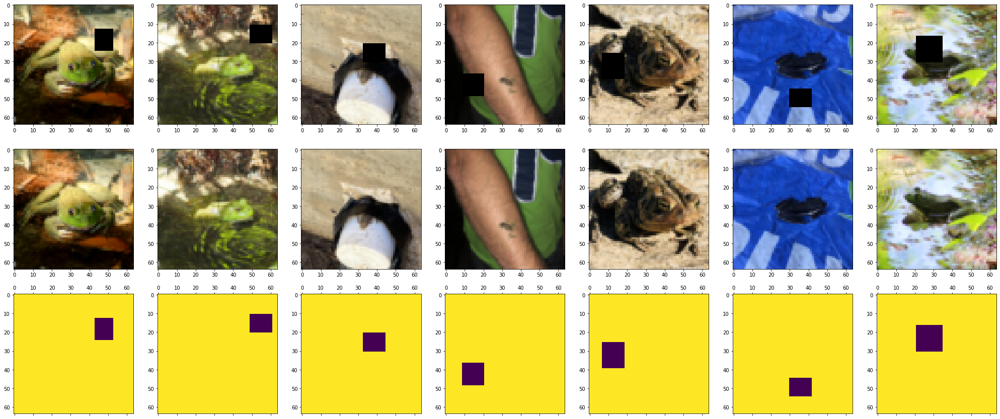

In [41]:
sample_batch(sample_dataset, sample_size = 7)

## 4. Data Analysis with Deep Learning

Recall that mathematically, the image inpainting task can be expressed at the level of sets: we are given one set of images in domain $X$ and a different set in domain $Y$, and can train a mapping $f: x → Y$ such that the output images are indistinguishable from known images from the target distribution $Y$. 

We therefore seek to explore image-generation techniques that can learn to translate between domains, with the assumption that there is some underlying relationship between the domains. For example, that they are two different and reasonable renderings of the same underlying scene - and we explore techniques that can learn that relationship.

We can define the training task by the input, output and loss – our model takes as input an image that has random parts of it removed, reconstructs an image, and is penalised by some notion of reconstruction loss in terms of similarity to the ground truth image (e.g. L2 loss). The exact loss function will depend on model architecture and downstream decisions, as we describe in each section.

In this section, we start off by first building baseline models for the image inpainting task using simple Multi-Layer Perceptrons (MLP) and Convolutional Neural Networks (CNN). These models serve as benchmarks for us to build our improvements upon, which we go through one step at a time.

### Experiment Setup

For all our subsequent experiments, we fix the size of our images to $H \times W = 64 \times 64$.

We have set the following training parameters: 
* Batch size of 64, for 20 epochs, to balance GPU memory constraints, epoch completion time vs. stochasticity in gradient descent, and model training time
* Initial learning rate of 0.001, with ADAM optimizer, for its [effectiveness](https://cs231n.github.io/neural-networks-3/)
* Learning rate schedule to halve learning rate after 3 epochs of no-improvement in validation loss
* 64 channels all the way for all our models


#### Datasets

In [38]:
train_dataset = AnimalDataset(index_file_path = os.path.join(DATA_ROOT, "frogs_train.txt"),
    root_dir_path = DATASET_PATH,
    local_dir_path = PREPROCESSED_FOLDER,
    file_prefix = "frogs_",
    image_dimension = 64,
    concat_mask = True,
    random_noise = False,
    require_init = False,
    drops = [])

valid_dataset = AnimalDataset(index_file_path = os.path.join(DATA_ROOT, "frogs_val.txt"),
    root_dir_path = DATASET_PATH,
    local_dir_path = PREPROCESSED_FOLDER,
    file_prefix = "frogs_",
    image_dimension = 64,
    concat_mask = True,
    random_noise = False,
    require_init = False,
    drops = [])

test_dataset = AnimalDataset(index_file_path = os.path.join(DATA_ROOT, "frogs_test.txt"),
    root_dir_path = DATASET_PATH,
    local_dir_path = PREPROCESSED_FOLDER,
    file_prefix = "frogs_",
    image_dimension = 64,
    concat_mask = True,
    random_noise = False,
    require_init = False,
    center_mask = True,
    drops = [])

Train dataset:


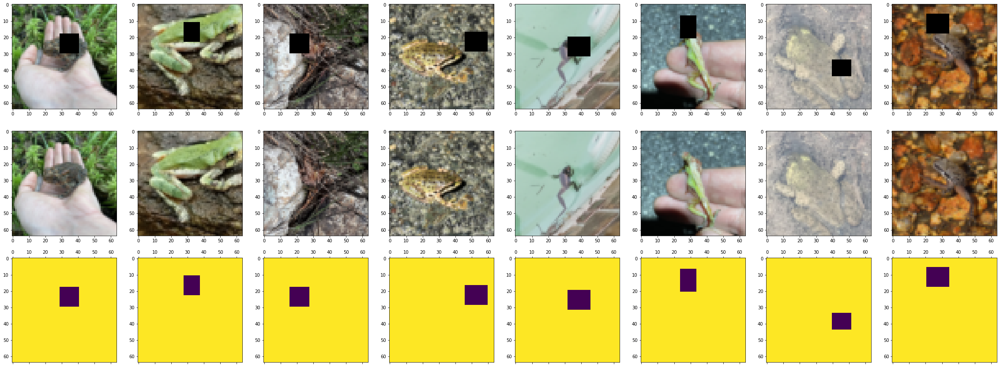

Validation dataset:


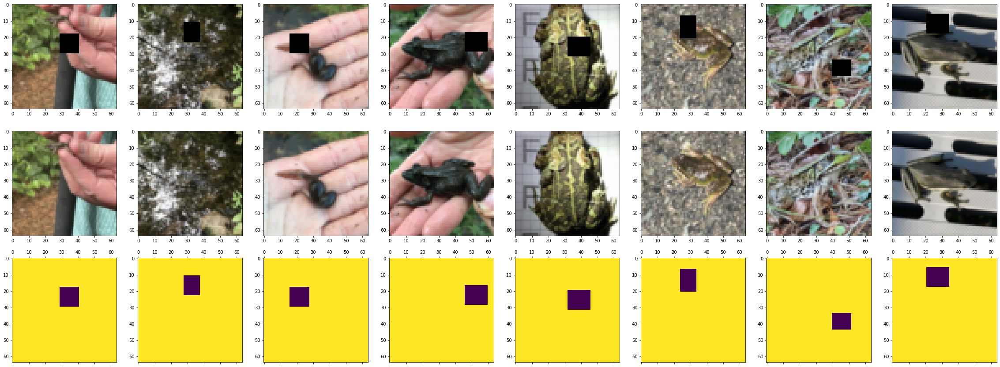

Test dataset:


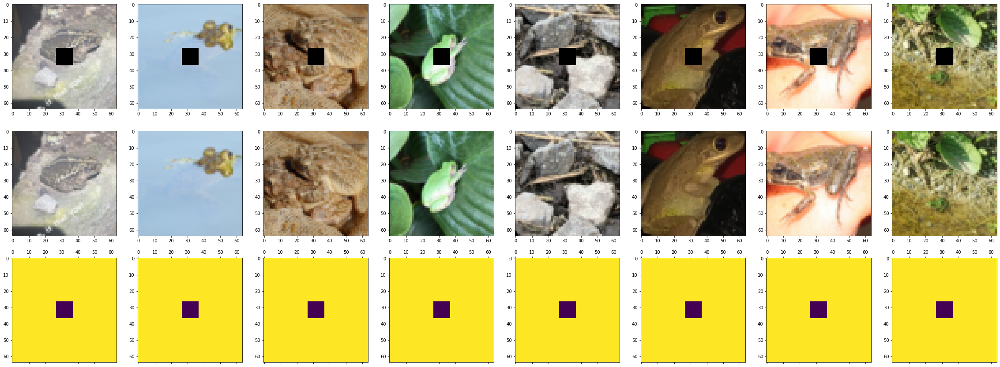

In [42]:
# sanity check
print("Train dataset:")
sample_batch(train_dataset, sample_size = 8)
print("Validation dataset:")
sample_batch(valid_dataset, sample_size = 8)
print("Test dataset:")
sample_batch(test_dataset, sample_size = 8)

#### Evaluation metrics

To quantitatively evaluate the performance and learning of our models, we use a combination of the following metrics:
1. [Learned perceptual similarity (VGG)](https://richzhang.github.io/PerceptualSimilarity/), for its effectiveness in measuring perceptual similarity. 
2. Peak Signal-to-Noise Ratio (PSNR)
3. Mean Absolute Error (L1 loss)
4. Mean Squared Error (L2 loss)

**Note that for measurement of metrics, we fix the mask at the centre of the image at 10x10 pixel size, since dynamic masking would not be representative.**

In [43]:
VGG_LPIPS = lpips.LPIPS(net = 'vgg')
METRICS = {
    "Peak SnR (Whole)" : lambda img, gt, mask : torchmetrics.functional.peak_signal_noise_ratio(img * (1-mask) + gt * mask, gt),
    "L2 loss (Whole)" : lambda img, gt, mask : nn.functional.mse_loss(img * (1-mask) + gt * mask, gt),
    "L2 loss (Mask)" : lambda img, gt, mask : nn.functional.mse_loss(img * (1-mask), gt * (1-mask), reduction = 'sum')/(1-mask).sum(),
    "L1 loss (Whole)" : lambda img, gt, mask : nn.functional.l1_loss(img * (1-mask) + gt * mask, gt),
    "L1 loss (Mask)" : lambda img, gt, mask : nn.functional.l1_loss(img * (1-mask), gt * (1-mask), reduction = 'sum')/(1-mask).sum(),
    "LPIPS (Whole)" : (lambda img, gt, mask : VGG_LPIPS(img * (1-mask) + gt * mask, gt).mean()),
}

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Loading model from: /usr/local/lib/python3.7/dist-packages/lpips/weights/v0.1/vgg.pth


#### Download model weights
In this notebook we primarily document the test results and high level implementation of our models. 

So here we download all model weights of trained models for demonstration of testing in the individual sections.

In [44]:
# Gdrive link: https://drive.google.com/file/d/1p64ojuWJPrnQBzNQeSGo-5ukrpPXg72o/view?usp=sharing

file_id = '1p64ojuWJPrnQBzNQeSGo-5ukrpPXg72o'
file_name = "model_weights.zip"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={file_id}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={file_id}" -O {file_name} && rm -rf /tmp/cookies.txt

# Unzip dataset
if os.path.exists(file_name):
    with zipfile.ZipFile(file_name, 'r') as ziphandler:
        ziphandler.extractall()
    models_len = len(glob.glob(os.path.join(MODEL_WEIGHTS_PATH, '*')))
    print(f"Successfully downloaded and unzipped {models_len} model weights.")
else:
    print("Zip file was not downloaded successfully! Please run the code block again.")

--2022-04-27 15:34:24--  https://docs.google.com/uc?export=download&confirm=t&id=1p64ojuWJPrnQBzNQeSGo-5ukrpPXg72o
Resolving docs.google.com (docs.google.com)... 142.251.8.113, 142.251.8.139, 142.251.8.100, ...
Connecting to docs.google.com (docs.google.com)|142.251.8.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0o-30-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5k9gm23bm8h0ltfap69760uvd735m3al/1651073625000/14966598133122679211/*/1p64ojuWJPrnQBzNQeSGo-5ukrpPXg72o?e=download [following]
--2022-04-27 15:34:25--  https://doc-0o-30-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/5k9gm23bm8h0ltfap69760uvd735m3al/1651073625000/14966598133122679211/*/1p64ojuWJPrnQBzNQeSGo-5ukrpPXg72o?e=download
Resolving doc-0o-30-docs.googleusercontent.com (doc-0o-30-docs.googleusercontent.com)... 108.177.125.132, 2404:6800:4008:c01::84
Connecting to doc-0o-30-docs.googleusercontent.com (doc-0o-30-do

#### Define helper functions

In [45]:
def summary(model: nn.Module, verbose = False):
    """
    This method helps summarize a model.
    """
    count = 0
    if verbose:
        print(model)

    for name, params in model.named_parameters():
        num_params = params.flatten().size()[0]
        count += num_params
        if verbose:
            print(f"\nlayer: {name}")
            print(f"number of params: {num_params}")
            print(f"params shape: {params.size()}")

    print(f"model has {count/1e6} million parameters")


def run_inference(model_g: nn.Module, test_dataset: torch.utils.data.Dataset, sample_size: int, seed: int, mode: int = 0):
    ## Dataloader for test set
    test_dataloader = DataLoader(test_dataset, batch_size = 32, shuffle = False, num_workers = 2)
    
    generator = model_g.eval()
    metrics = METRICS
    # epoch statistics
    running_results = {list(metrics.keys())[i] : 0.0 for i in range(len(metrics)) } 
    
    batch_to_show = None

    # ===== EVALUATE EPOCH =====

    with torch.no_grad():
        batches = 0
        for index, batch in enumerate(test_dataloader, 1):
            
            batches += 1

            # input and ground truth
            input_batched = batch["image"]
            ground_truth_batched = batch["reconstructed"]
            mask_batched = batch["mask"]

            # ===== FORWARD PASS =====

            # 1. reshape to channel first
            input_batched = input_batched.permute(0, 3, 1, 2)
            ground_truth_batched = ground_truth_batched.permute(0, 3, 1, 2)
            mask_batched = mask_batched.permute(0, 3, 1, 2)

            # 2. predict    
            output_batched = generator(input_batched)
            if mode == 0:
                spliced_batched = ((1-mask_batched) * output_batched) + (mask_batched * ground_truth_batched)             
                for key, func in metrics.items():
                    running_results[key] += func(output_batched, ground_truth_batched, mask_batched).detach().item()
            elif mode == 1:
                #edge
                spliced_batched = ((1-mask_batched) * output_batched[0]) + (mask_batched * ground_truth_batched)   
                for key, func in metrics.items():
                    running_results[key] += func(output_batched[0], ground_truth_batched, mask_batched).detach().item()

            # 3. evaluate

            
            if batch_to_show is None:
                batch_to_show = True
                fig, ax = plt.subplots(3, sample_size, figsize = (sample_size * 5, 15, ))
                for i in range(sample_size):
                    image = input_batched[i].permute(1,2,0)
                    reconstructed = ground_truth_batched[i].permute(1,2,0)
                    predicted = spliced_batched[i].permute(1,2,0)

                    if image.shape[-1] > 3: 
                        image = image[:, :, 0:3] # take rgb if more than 3 channels

                    ax[0][i].imshow(image)
                    ax[1][i].imshow(reconstructed)
                    ax[2][i].imshow(predicted)
                
    # normalise numbers by batch
    for key, _ in running_results.items():
        running_results[key] /= batches
    
    
    # pretty print metrics
    
    df = pd.DataFrame(running_results,index=[0])
    pdtabulate = lambda df: tabulate(df, headers='keys', tablefmt='psql', showindex=False)

    print(pdtabulate(df))
    
    return running_results

### 4.1 Baseline Benchmarks

We start off by building simple vanilla models like the MLP and CNN models. These will serve as baseline models for us to benchmark our results.

#### Loss function

To build the baselines, we view the task of image inpainting as a simple task of regressing the missing pixels to the ground truth content, similar to that in Pathak et al. [11]. Hence, we utilize a masked L2 loss as a pixel-wise reconstruction loss to train both baseline models. This is defined as follows:
$$
\mathcal{L}_{rec}(x) = \|(1 - M) \odot (x - G(M \odot x)) \|_2
$$
where $M$ is a binary mask with 0s at the damaged regions and 1s at the non-damaged regions, $G$ is the deep learning model, $x$ is the ground truth image, and $\odot$ denotes element-wise multiplication. This means that we only take the l2 loss on the regions that are reconstructed by the model, since only those regions are important to the model's learning.

#### 4.1.1 MLP

##### 4.1.1.1 Model architecture

Our MLP architecture consists of 3 fully-connected layers with 64 channels. 

After each fully connected layer, we utilize batch-normalization to normalize the inputs to the subsequent layer. This standardizes the inputs to have a mean of 0 and standard deviation of 1, thus ensuring that backpropagation is not affected by the relative scale of the weights in the model. [Batch normalization](https://arxiv.org/abs/1502.03167) has been shown to result in more stable and faster training, less overfitting and better performance in general. 

After batch normalization, the batch of inputs is then passed through the Mish activation function [12]. The Mish activation is defined as $f(x)=x ⋅ \text{tanh} ⋅ (\text{softplus}(x))$, and has been empirically [shown](https://arxiv.org/abs/1908.08681) to perform better than ReLU on a multitude of computer vision tasks, including classification, detection, segmentation, and also generation.

The implemention is shown below.

In [ ]:
class LinearBlock(nn.Module):
    """
    This class encapsulates a linear layer. 
    Linear -> BN -> activation
    """

    def __init__(self, input_dim, output_dim, activation = nn.ReLU):
        super(LinearBlock, self).__init__()

        self.linear = nn.Linear(input_dim, output_dim)
        self.activation = activation()
        self.bn = nn.BatchNorm1d(output_dim)

    def forward(self, input_tensor):
        
        x = input_tensor
        x = self.linear(x)
        x = self.bn(x)
        x = self.activation(x)

        return x


class MLP(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation, image_shape):
        super(MLP, self).__init__()
        
        INPUT_DIM = image_shape * image_shape * input_dim
        OUTPUT_DIM = image_shape * image_shape * output_dim
        self.linear0 = LinearBlock(INPUT_DIM, hidden_dim, activation)
        self.linear1 = LinearBlock(hidden_dim, hidden_dim, activation)
        self.linear2 = LinearBlock(hidden_dim, hidden_dim, activation)
        self.final = nn.Linear(hidden_dim, OUTPUT_DIM)

    def forward(self, input_tensor):
        b, c, h, w = input_tensor.shape    
        x = input_tensor.reshape(b, c*h*w)
        x = self.linear0(x)
        x = self.linear1(x)
        x = self.linear2(x)
        x = self.final(x)
        x = x.reshape(b, 3, h, w)

        return x

##### 4.1.1.2 MLP Results visualisation
Here, we initialize the model from saved weighs after 20 epochs of training, and then run the model on the test set.

In [ ]:
mlp_weights = os.path.join(MODEL_WEIGHTS_PATH, "mlp_generator_epoch20.pt")
mlp = MLP(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish, image_shape=64)
mlp.load_state_dict(torch.load(mlp_weights, map_location=device))
print(f"Loaded generator weights from {mlp_weights}.")

summary(mlp)

Loaded generator weights from model_weights/mlp_generator_epoch20.pt.
model has 1.856064 million parameters


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            32.3722 |       0.000582524 |        0.0715806 |        0.00296437 |         0.364262 |       0.0310939 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


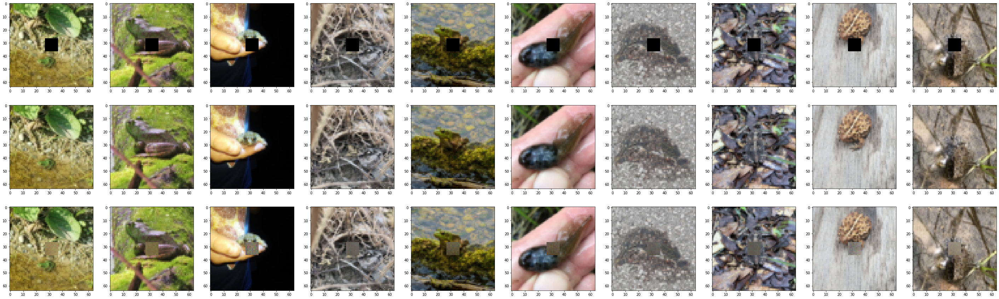

In [ ]:
mlp_results = run_inference(mlp, test_dataset=test_dataset, sample_size=10, seed=None)

#### 4.1.2 CNN

##### 4.1.2.1 Model architecture
Our CNN architecture consists of 17 convolutional layers, all with 64 channels, and same padding to maintain feature map size in between layers. We chose 17 layers to keep the baseline CNN model consistent with the subsequent models explored, which build upon this CNN architecture. Like the MLP model above, we also utilize Batch-Normalization and the Mish activation funtion.

We do not use pooling layers in our CNN since it does not help in a reconstruction task like image inpainting [11]. As seen in the lecture, pooling layers are utilized to introduce spatial feature invariance, which does not benefit image inpainting since we require our generated images to be coherent in structure and content with the damaged input image.

In addition, we introduce residual skip connections [13] after each convolutional block  $conv → bn → mish$ in our CNN model. Residual skips has been shown to result in better performance for deep learning models with many layers in multiple tasks. Given a layer $F$ and input $x$, a residual skip connections is simply defined as $H(x) = F(x) + x$, which is an identity connection that adds the output of the previous layer to the output of the current layer. This identity connection allows the model to effectively learn identity mappings within its layers, thus reducing the learning complexity in deeper models. Moreover, residual skip connection have also been shown to result in a smoother loss landscape, thus leading to better generalization and faster training overall [14].

In [ ]:
class Conv2dBlock(nn.Module):
    """
    This class encapsulates a standard convolution block.
    Conv -> BN -> activation
    """

    def __init__(self, input_dim, output_dim, 
        kernel_size = 3, stride = 1, padding = 'same', dilation = 1, 
        activation = nn.ReLU):

        super(Conv2dBlock, self).__init__()

        self.conv = nn.Conv2d(input_dim, output_dim, kernel_size, stride, padding, dilation)
        self.bn = nn.BatchNorm2d(output_dim)
        self.activation = activation()


    def forward(self, input_tensor):
        
        x = input_tensor
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)

        return x


class CNN(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(CNN, self).__init__()
        
        # 4 x same
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 2 x  same
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x same
        self.conv6 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv7 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv8 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv9 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 2 x same
        self.conv10 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x same
        self.conv12 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv13 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv15 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x) + x
        x = self.conv2(x) + x
        x = self.conv3(x) + x
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x
        x = self.conv12(x) + x
        x = self.conv13(x) + x
        x = self.conv14(x) + x
        x = self.conv15(x) + x
        
        # final
        x = self.final(x)

        return x

##### 4.1.2.2 CNN Results visualisation

In [ ]:
cnn_weights = os.path.join(MODEL_WEIGHTS_PATH, "cnn_generator_epoch20.pt")
cnn = CNN(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
cnn.load_state_dict(torch.load(cnn_weights, map_location=device))
print(f"Loaded generator weights from {cnn_weights}.")

summary(cnn)

Loaded generator weights from model_weights/cnn_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            35.1031 |       0.000314723 |        0.0386731 |        0.00204271 |         0.251009 |       0.0175084 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


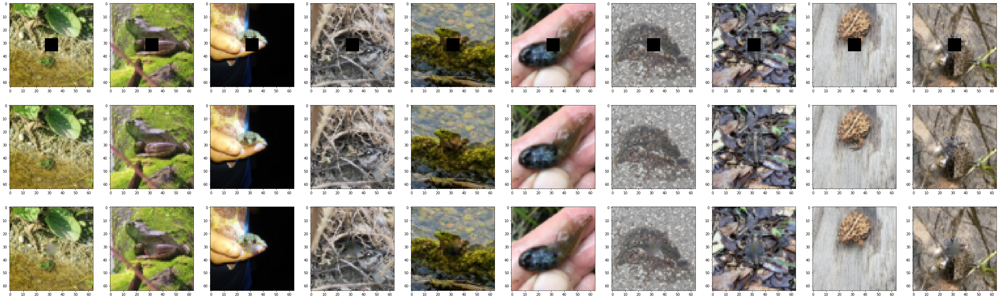

In [ ]:
cnn_results = run_inference(cnn, test_dataset=test_dataset, sample_size=10, seed=None)

#### 4.1.3 MLP & CNN results and analysis

| Metric| MLP     | CNN     | 
| ----- | ------- | ------- |
| L1    | 0.3642​   | **0.2510​**  |
| L2    | 0.07158​ | **0.03867​** |
| LPIPS | 0.03109​ | **0.01882​** |
| PSNR  | 32.37​   | **35.10**  |


<p align="center">
  <img src="https://i.ibb.co/z4D7DMn/MLP.png" />
</p>
<center><i> MLP generations on test set. </i></center>
<p align="center">
  <img src="https://i.ibb.co/TrXFcL5/CNN.png" />
</p>
<center><i> CNN generations on test set. </i></center>
​


<center><i>Performance of MLP and CNN for our evaluation metrics. The best score for each metric is <b>bolded</b>.</i> </center>

As expected, the CNN outperforms the MLP in all metrics measured. The MLP does not possess the translation invariant property that the CNN has, and thus is not suited for a complex task like image inpainting, and is significantly overparametrized

That said, an examination of the generated images show that both methods are not capable of inpainting realistic looking results. The generated patches are generally blur without any finer structures such as lines and edges. 







### 4.2 Standard Approaches for Image Inpainting

Most approaches in literature surrounding image inpainting revolve around four main types of models - autoregressive models, autoencoders, variational autoncoders and generative adversarial networks [1]. 

In this section we explore two commonly used approaches for the task of image inpainting: AutoEncoders and Generative Adversarial Networks, as baselines.

#### 4.2.1 AutoEncoder


The AutoEncoder is a neural network architecture that comprise two parts: the encoder and the decoder. In the context of image-related tasks the encoder maps the image inputs into a low-dimensional latent space. The feature vectors present in this low-dimensional latent space represents the high-level image features that are extracted from the encoder. It can be seen as a compact knowledge representation of the original input image [11]. The decoder then decodes these latent representations and reconstructs the latent features back into the original image space. AutoEncoders are commonly used for image reconstruction and generation tasks as they are able to learn an abstract, high-level representation of the image in the middle (bottleneck layer), which allows them to reconstruct the original image more easily.

<p align="center">
  <img src="https://i.ibb.co/0M0pTm1/autoencoder-diagram.png" />
</p>
<center><i> Illustration of AutoEncoder architecture. </i></center>



##### 4.2.1.1 Model Architecture
Similar to our CNN model, our AutoEncoder model also consists of 17 convolutional blocks. The first 4 blocks downsamples the image input by a factor of 4 (halving in the 2nd and 4th layer) to yield a compact representation of the image. Since we fix our image size to $64 \times 64$, the intermediate model outputs after the first 4 convolutional blocks have a spatial dimension of $16 \times 16$. This is followed by 8 layers of same-size convolutional blocks, before finally upsampling the intermediate outputs in the final 4 layers. As with our MLP and CNN baselines, we utilize batch-normalization, Mish activation function, and keep to 64 channels in our convolutional blocks.

Transposed convolutions have been known to create checkerboard artifacts in image generation tasks due to the uneven overlapping of the convolutional filter with the feature maps during the transposed convolution step [15]. To overcome this issue, we use resize-convolutions introduced in Odena et al. [15], which is a combination of upsampling to the desired size of the next layer, and applying convolutions to compute image features. In our model, we upsample using nearest neighbour interpolation.

The AutoEncoder is trained with the same masked L2 loss function as the MLP and CNN baselines.

In [ ]:
class UpConv2dBlock(nn.Module):
    """
    This class encapsulates upsampling by upsampling then convolution. 
    Here is a reference of this technique compared to transposed convolutions:
    Odena, et al., "Deconvolution and Checkerboard Artifacts", Distill, 2016. http://doi.org/10.23915/distill.00003
    """

    def __init__(self, input_dim, output_dim, 
        kernel_size = 3, stride = 1, padding = 'same', dilation = 1, 
        activation = nn.ReLU, 
        scale_factor = (2,2), mode = 'nearest'):

        super(UpConv2dBlock, self).__init__()
        self.upsample = nn.Upsample(scale_factor = scale_factor, mode = mode)
        self.conv = nn.Conv2d(input_dim, output_dim, kernel_size, stride, padding, dilation)
        self.activation = activation()
        self.bn = nn.BatchNorm2d(output_dim)

    def forward(self, input_tensor):
        
        x = input_tensor
        x = self.upsample(x)
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)

        return x


class AutoEncoder(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(AutoEncoder, self).__init__()
        
        # same -> down -> same -> down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 8 x  same
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv6 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv7 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv8 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv9 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv10 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = UpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv13 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = UpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv15 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # up sample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x

##### 4.2.1.2 AutoEncoder Results visualisation

In [ ]:
autoencoder_weights = os.path.join(MODEL_WEIGHTS_PATH, "autoencoder_generator_epoch20.pt")
autoencoder = AutoEncoder(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
autoencoder.load_state_dict(torch.load(autoencoder_weights, map_location=device))
print(f"Loaded generator weights from {autoencoder_weights}.")

summary(autoencoder)

Loaded generator weights from model_weights/autoencoder_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            35.5781 |        0.00027985 |         0.034388 |        0.00192118 |         0.236075 |       0.0211599 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


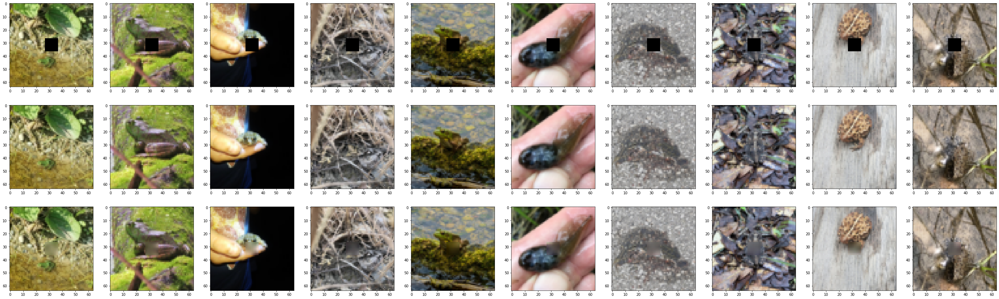

In [ ]:
autoencoder_results = run_inference(autoencoder, test_dataset=test_dataset, sample_size=10, seed=None)

#### 4.2.2 Generative Adversarial Networks (GANs)
<a name="gan"></a>


##### What are GANs?
Generative Adversarial Networks (GANs) are by far the most popular approach used in image inpainting. First introduced by Goodfellow et al. [16] for the task of image generation, GANs have very quickly overtaken other image generation approaches (such as the Variational AutoEncoder) to become the most dominant approach due to its ability to generate convincing and realistic-looking images. In this section, we first describe the general idea behind GANs and then subsequently contextualize it to the task of image inpainting.

##### GANs and Adversarial Loss
The basic GAN architecture comprises two key components: a generator network $G$ that learns to generate an image from a random noise vector, and a discriminator network $D$, which is a binary classifier, that learns to classify which images are real and which are generated. The core idea behind the GAN architecture is to have these two networks to compete against each other in an adversarial setting. The generator tries to fool the discriminator by learning to generate realistic images, and the discriminator competes against the generator by learning to distinguish generated images from real images. Then, each improvement of one model will benefit the learning of the other. This mechanism is reflected in the adversarial loss that is used to train the GAN, as seen below:
$$
\arg\underset{G}\min\underset{D}\max \mathcal{L}_{adv}(G,D) = \mathbb{E}_{x \in \mathcal{X}}[\log D(x)] + \mathbb{E}_{z \in \mathcal{Z}}[\log (1 - D(G(z)))]
$$
where $x$ is a real image drawn from the distribution of real images $\mathcal{X}$ and $z$ is a random noise vector sampled from a chosen distribution $\mathcal{Z}$. To train the discriminator we maximize the above loss function over $D$'s parameters against a fixed $G$. If $D$ learns to correctly differentiate real images from the generated images, $\mathbb{E}_{x}[\log D(x)] = \mathbb{E}_{x}[\log (1)] = 0$ and   $\mathbb{E}_{z}[\log (1 - D(G(z)))] = \mathbb{E}_{z}[\log (1 - 0)] = 0$ will be maximized towards 0. To train the generator, we minimize the above loss function over $G$'s parameters against a fixed $D$. If $G$ learns to fool the discriminator by generating realistic-looking images, $\mathbb{E}_{z}[\log (1 - D(G(z)))] = \mathbb{E}_{z}[\log (1 - 1)] = -\infty$ will be minimized towards negative infinity. 

The generator and discriminator networks are trained in an alternating fashion, where the improvement of one network will benefit the learning of the other, thus simultaneously improving the performance of both models. 

Since $D$ learns to correctly classify the real distribution of images, to successfully fool the discriminator, the generator learns to produce images that belonging to the real distribution. Hence, this allows the GAN architecture to produce convincing and realistic looking images.

##### GANs in Image Inpainting
In the context of image inpainting, we replace the noise vector input to the generator to with the damaged image instead. This can also be seen as "conditioning" the generator on the damaged image, such that it can learn the surrounding context and semantic content in the non-damaged portions and fill the missing portions in a semantically coherent manner. In addition to utilizing the GAN objective function, we also use the masked L2 reconstruction loss used in the other baseline models. Altogether, our objective function is as follows:
$$
\begin{align}
\mathcal{L}_{rec}(x) &= \|(1 - M) \odot (x - G(M \odot x)) \|_2 \\
\mathcal{L}_{adv}(G,D) &= \mathbb{E}_{x \in \mathcal{X}}[\log D(x) + \log (1 - D(G(M \odot x)))] \\
\mathcal{L}_{objective} &= \arg\underset{G}\min\underset{D}\max \mathcal{L}_{rec} + \alpha\mathcal{L}_{adv}
\end{align}
$$
where $\alpha$ is a hyper-parameter that controls the relative strength of the adversarial loss against the reconstruction loss.

As seen in the earlier sections on MLP, CNN, and AutoEncoder, the masked L2 loss encourages the model to produce a rough outline of the predicted object, but the results are blur and lack realistic detail. The adversarial loss then complements the masked L2 loss by encouraging the model to produce more realistic looking images. It also encourages diversity in the missing portions of the reconstructed images.

##### Non-saturating loss
While GANs are capable of producing realistic-looking images, they are also notorious for being very difficult to train, for they suffer from the problem of an unstable optimization procedure due to the min-max training procedure. Thus, in practice we modify the loss function of the generator from $\underset{G}\min \log(1 - D(G(\cdot))$ to $\underset{G}\max \log(D(G(\cdot))$. This is known as the non-saturating loss and has been empirically shown to result in a more stable training process [16].

##### 4.2.2.1 Model Architecture

<p align="center">
  <img src="https://i.ibb.co/23KsM5h/gan-diagram.png" />
</p>
<center><i> Illustration of GAN architecture. </i></center>

For consistency in comparison, our generator utilizes the exact same architecture as the AutoEncoder. Our disciminator consists of 5 convolutional blocks and a final linear layer for classification.

In [ ]:
class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> down -> same -> down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 8 x  same
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv6 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv7 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv8 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv9 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv10 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = UpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv13 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = UpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv15 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # up sample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x


class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, 1)


    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x

##### 4.2.2.2 GAN Results visualisation

Initialize model

In [ ]:
gan_1_weights = os.path.join(MODEL_WEIGHTS_PATH, "gan_1_generator_epoch20.pt")
gan_1_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
gan_1_generator.load_state_dict(torch.load(gan_1_weights, map_location=device))
print(f"Loaded generator weights from {gan_1_weights}.")

summary(gan_1_generator)

Loaded generator weights from model_weights/gan_1_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.4302 |       0.000362975 |        0.0446024 |        0.00223769 |         0.274967 |       0.0188187 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


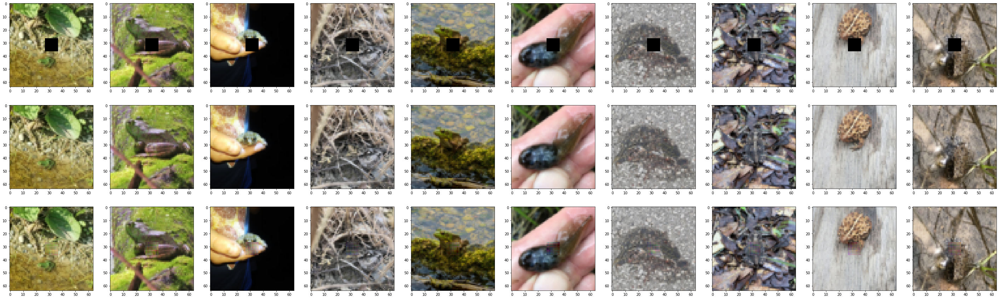

In [ ]:
gan_1_results = run_inference(gan_1_generator, test_dataset=test_dataset, sample_size=10, seed=None)

#### 4.2.3 All baselines results and analysis

<p align="center">
  <img src="https://i.ibb.co/S6mY2Hc/MLP-plots.png" width=100% />
</p>
<center><i> MLP generations on test set with dynamic masks. </i></center>

<p align="center">
  <img src="https://i.ibb.co/MBqwLc7/CNN-plots.png" width=100% />
</p>
<center><i> CNN generations on test set with dynamic masks. </i></center>

<p align="center">
  <img src="https://i.ibb.co/9symKG2/AE-plots.png" width=100% />
</p>
<center><i> AutoEncoder generations on test set with dynamic masks. </i></center>

<p align="center">
  <img src="https://i.ibb.co/mz1HFyn/GAN-1-plots.png" width=100% />
</p>
<center><i> GAN generations on test set with dynamic masks. </i></center>

<p align="center">
  <img src="https://i.ibb.co/MDf3yPJ/baseline-curves.png" width=100% />
</p>
<center><i> Validation curves of the baseline models. Visualized by WandB. (Blue) MLP (Red) GAN (Yellow) CNN (Green) AutoEncoder </i></center>


| Metric| MLP     | CNN     | AutoEncoder | GAN     |
| ----- | ------- | ------- | ----------- | ------- |
| L1    | 0.3642​  | 0.2510  | **0.2361​**  | 0.2750​  |
| L2    | 0.07158 | 0.03867 | **0.03439​** | 0.04460​ |
| LPIPS | 0.03109​ | 0.01882 | 0.02116​     | **0.01750​** |
| PSNR  | 32.37​   | 35.10   | **35.58​**  | 34.43​   |

<center><i>Performance of AutoEncoder and GAN against MLP and CNN baselines. The best score for each metric is <b>bolded</b>.</i> </center>

As seen from the table above, the AutoEncoder and GAN performed better than the MLP and CNN baselines in all metrics. Interestingly, the AutoEncoder performed the best in all except for the LPIPS metric (which measures perceptual similarity using the VGG model) - while the GAN scored the best in this metric. And yet, an examination of the images suggest that the GAN produces the most realistic looking result, and the LPIPS measure supports this. What could cause this seeming contradiction?

There is [evidence](https://arxiv.org/abs/1511.08861) to suggest that L1, L2 loss and PSNR all favour blurry and smooth images without much texture. This explanation is consistent with our observations - the generated images of the AutoEncoder are indeed smoother, while those of the GAN are closer to our subjective judgement.



#### 4.2.4 Exploring the $\alpha$ hyper-parameter for GAN
GANs are notorious for being very difficult to train and very sensitive to hyper-parameter tunings. 

In particular, we experimentally observed that our model was very sensitive to the $\alpha$ hyper-parameter, which controls the weight of the adversarial loss as compared to the reconstruction loss. Bad $\alpha$ values can result in instable training and diverging generator and discriminator training losses.Hence, we experiment with different $\alpha$ parameters to find out which value of $\alpha$ produces the best result. 

We tested these models at a log-scale - at values of 1 (already above), 0.1, 0.01 and 0.001. The results are shown below.

###### 4.2.4.1 GAN at $\alpha = 0.1$

In [ ]:
gan_01_weights = os.path.join(MODEL_WEIGHTS_PATH, "gan_0.1_generator_epoch20.pt")
gan_01_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
gan_01_generator.load_state_dict(torch.load(gan_01_weights, map_location=device))
print(f"Loaded generator weights from {gan_01_weights}.")

summary(gan_01_generator)

Loaded generator weights from model_weights/gan_01_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.2563 |       0.000379741 |        0.0466626 |        0.00227141 |         0.279111 |       0.0194531 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


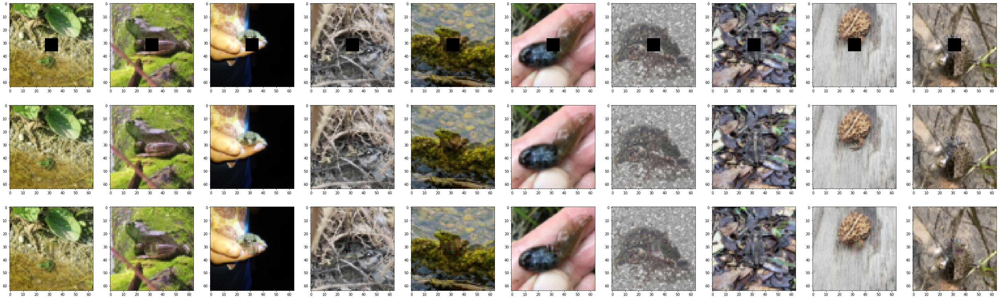

In [ ]:
gan_01_results = run_inference(gan_01_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.2.4.2 GAN at $\alpha = 0.01$

In [ ]:
gan_001_weights = os.path.join(MODEL_WEIGHTS_PATH, "gan_0.01_generator_epoch20.pt")
gan_001_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
gan_001_generator.load_state_dict(torch.load(gan_001_weights, map_location=device))
print(f"Loaded generator weights from {gan_001_weights}.")

summary(gan_001_generator)

Loaded generator weights from model_weights/gan_0.01_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            35.1391 |       0.000309324 |        0.0380097 |        0.00203009 |         0.249458 |       0.0213654 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


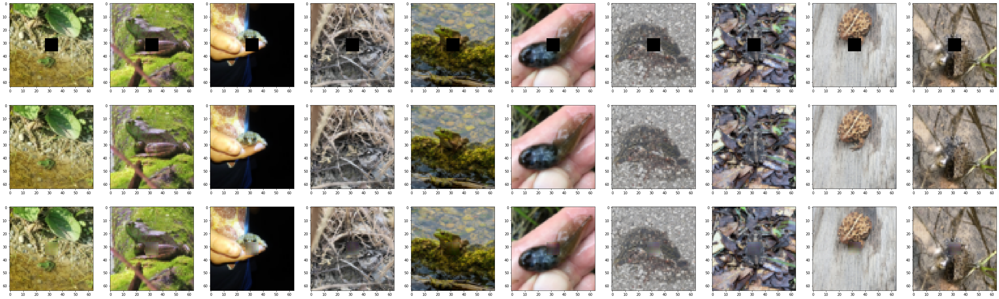

In [ ]:
gan_001_results = run_inference(gan_001_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.2.4.3 GAN at $\alpha = 0.001$

In [ ]:
gan_0001_weights = os.path.join(MODEL_WEIGHTS_PATH, "gan_0.001_generator_epoch20.pt")
gan_0001_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
gan_0001_generator.load_state_dict(torch.load(gan_0001_weights, map_location=device))
print(f"Loaded generator weights from {gan_0001_weights}.")

summary(gan_0001_generator)

Loaded generator weights from model_weights/gan_0.001_generator_epoch20.pt.
model has 0.560067 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.4302 |       0.000362975 |        0.0446024 |        0.00223769 |         0.274967 |       0.0188187 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


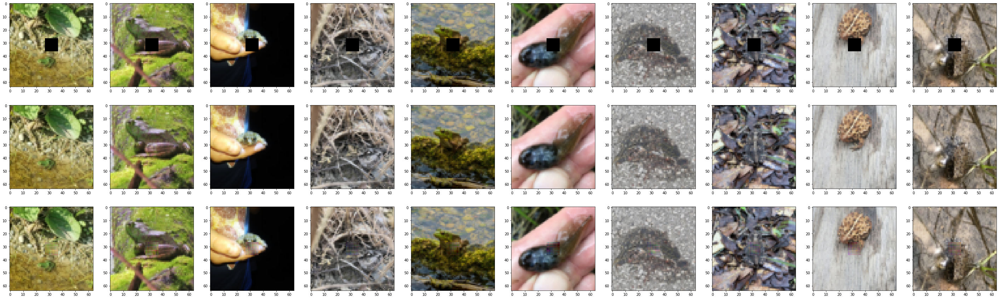

In [ ]:
gan_0001_results = run_inference(gan_0001_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.2.4.4 Analysis of $\alpha$

Our results are recorded in the table below.

| Metric| $\alpha=$ 1  | $\alpha=$ 0.1 | $\alpha=$ 0.01 | $\alpha=$ 0.001 |
| ----- | -------     | ------- | ----------- | ------- |
| L1    | 0.2750      | 0.2791  | 0.2495      | **0.2459** |
| L2    | 0.04460     | 0.04667 | 0.03801 | **0.03672** |
| LPIPS | **0.01882** | 0.01945 | 0.02137     | 0.02247 |
| PSNR  | 34.43       | 34.26  | 35.14  | **35.29**  |

<center><i>Performance of GAN at different $\alpha$ values. The best score for each metric is <b>bolded</b>.</i></center>

Qualitative evaluation shows that the GAN model with $\alpha = 1$ generates the best images. Additionally, it has highest perceptual similarity. So, we use this $\alpha$ value for all our subsequent experiments.


### 4.3 Proposed Improvements to Architectures

A review of deep learning image inpainting literature, highlighted several techniques that brought significant improvements, of which four notable ones are:
- Dilated convolutions to increase local receptive field
- Gated Convolutions
- Local and Global Discriminators
- Patch based Discriminators

These techniques are all built upon the GAN architecture defined and developed in [GAN section](#gan). They are explained in greater detail in the following sections.

#### 4.3.1 Introducing dilated and gated convolutions

##### Dilated Convolutions

<a name="dilated"></a>
Dilated (atrous) convolutions, first introduced by Yu and Kolton [18], are used to increase the local receptive field of a convolutional network while keeping number of parameters the same. The receptive field is defined as the size of the region in the input image that produces the feature in any particular layer [19]. Essentially, this determines how much each layer of the convolutional neural network "sees" when computing intermediate features. Large receptive fields are important in image-related tasks as it allows convolutional neural networks to learn global image features. Dilated convolutions increases the local receptive fields by adding "holes" in between the convolutional kernels, thus doing so at the cost of no additional parameters. This is seen in the figure below.

<p align="center">
  <img src="https://raw.githubusercontent.com/vdumoulin/conv_arithmetic/master/gif/dilation.gif" />
</p>
<center><i>Dilated convolutions with dilation = 2. Image taken from Dumolin & Visin, 2016 [27].</i></center>

Large receptive fields are crucial in the task of image inpainting due to the importance of generating pixels that are semantically coherent with the provided context (i.e. non-missing portions of the image). By increasing the local receptive fields with dilated convolutions, our model is able to "observe" a larger region of the input image and context, therefore encouraging our model to take into account of a larger context region when reconstructing the missing pixels. This effect is illustrated in the figure below.


<p align="center">
  <img src="https://i.ibb.co/QX2r8Hf/Screenshot-2022-04-27-at-6-31-45-PM.png" width=50%/>
</p>
<center><i>Figure taken from Iizuka et al. [7].</i></center>

We employ dilated convolutions in the middle 4 blocks of our generator in the GAN architecture with a dilation factor of 2, 4, 8, and 16. They are utilized in all three subsequent model improvement techniques.

##### Gated Convolutions

<a name="gated"></a>
Gated convolutions are motivated by the idea that valid (non-missing) and invalid (missing) pixels in an image should not be treated the same by the convolution operation. In the usual image inpainting setting, invalid pixels are replaced by a fixed placeholder value (0 in our case), but are otherwise treated the same as valid pixels by the standard convolution operation. As a result, the conditioning upon these initial placeholder values by the standard convolution operation results in  various types of visual artifacts that requires extensive post-processing [20]. 

##### Partial Convolutions
Partial convolutions were first proposed to resolve the issue of convolving on invalid pixels. Let $W$ be the convolutional filters, $O_{y,x}$ be the output features at row $y$ and column $x$ after the convolution, and $M$ be a binary mask where 1 denotes the valid pixels and 0 denotes the invalid pixels. The partial convolution operation is defined as follows:
$$
O_{y,x} = 
\begin{align}
\begin{cases}
\sum \sum W \cdot (\frac{I \odot M}{\text{sum}(M)}), \quad &\text{if } \text{sum}(M) > 0 \\
0, \quad &\text{otherwise} \\
\end{cases}
\end{align}
$$
As seen from above, the results computed from the partial convolution only depend on the valid pixels ($I \odot M$). After each partial convolution operation, the binary mask is updated by the following rule:
$$
m' =
\begin{align}
\begin{cases}
1, \quad &\text{sum}(M) > 0 \\
0, \quad &\text{otherwise} \\
\end{cases}
\end{align}
$$
where $m'$ is a location in the new mask $M'$ in the next partial convolution layer. While partial convolutions do improve the quality of inpainting, especially on irregular masks, there still remains the issue of This is further improved by Yu et al. [21] in their paper on gated convolutions.

##### Gated Convolutions
The core idea behind gate convolutions is essentially the same as partial convolutions, except that now a learnable soft-gating mechanism is used instead of a hard-gating binary mask. This mechanism is described in the following formulation of gated convolutions:
$$
\begin{align}
\text{Gating}_{y,x} &= \sum \sum W_g \cdot I \\
\text{Feature}_{y,x} &= \sum \sum W_f \cdot I \\
O_{y,x} &= \phi (\text{Feature}_{y,x}) \odot \sigma (\text{Gating}_{y,x}) \\
\end{align}
$$
where $W_g$ and $W_f$ are convolutional filters, $\phi$ is any activation function, and $\sigma$ is the sigmoid function. Then, $\sigma (\text{Gating}_{y,x})$ yields gating values between zeros and ones, thus acting as a soft probabilistic mask for the features. In addition to allowing these soft masks to be learnt from data across different gated convolution layers, this formulation allows the soft mask to be learnt for multiple feature channels, as opposed to the unlearnable, single-channel hard-gating of partial convolutions. 

This has been shown empirically to improve the quality of inpainted images, especially for irregularly shaped masks [21]. Moreover, it can very easily be implemented as a simple convolution + sigmoid function to generate the soft-gating values.

We note that a more [recent paper](https://arxiv.org/abs/2005.09704) reports improved results with a simplified version of the Gated convolution operation, but for convenience and consistency the original implementation is followed.

##### 4.3.1.1 Model Architecture

<p align="center">
  <img src="https://i.ibb.co/b6WG3Sx/dilated-gated-gan-diagram.png" />
</p>
<center><i> Illustration of DilatedGatedGAN architecture</i></center>

For this experiment, we replace the 17 standard convolutional blocks of the GAN architecture with gated convolutional blocks as defined below. As mentioned in the [dilated convolutions](#dilated) section, the we employ dilated convolutions in the middle 4 blocks of the generator. The discriminator architecture is kept the same for consistency in comparison.

In [ ]:
class GatedConv2d(nn.Module):

    """
    This class implements a gated convolution, following the implementation in the given reference.
    """

    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, dilation):
        super(GatedConv2d, self).__init__()
        self.image_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, dilation = dilation)
        self.gate_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, dilation = dilation)
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor, return_mask = False):

        mask = self.sigmoid(self.gate_conv(input_tensor))
        x = self.image_conv(input_tensor)
        x = torch.mul(x, mask) # apply mask

        if return_mask:
            return x, mask

        return x

class GatedUpConv2dBlock(nn.Module):

    def __init__(self, input_dim, output_dim, 
        kernel_size = 3, stride = 1, padding = 'same', dilation = 1, 
        activation = nn.ReLU, 
        scale_factor = (2,2), mode = 'nearest'):

        super(GatedUpConv2dBlock, self).__init__()


        self.upsample = nn.Upsample(scale_factor = scale_factor, mode = mode)
        self.conv = GatedConv2d(input_dim, output_dim, kernel_size, stride, padding, dilation)
        self.activation = activation()
        self.bn = nn.BatchNorm2d(output_dim)

    def forward(self, input_tensor):
        
        x = input_tensor
        x = self.upsample(x)
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)

        return x

class GatedConv2dBlock(nn.Module):
    """
    This class encapsulates a standard convolution block.
    Conv -> BN -> activation
    """

    def __init__(self, input_dim, output_dim, 
        kernel_size = 3, stride = 1, padding = 'same', dilation = 1, 
        activation = nn.ReLU):

        super(GatedConv2dBlock, self).__init__()

        self.conv = GatedConv2d(input_dim, output_dim, kernel_size, stride, padding, dilation)
        self.bn = nn.BatchNorm2d(output_dim)
        self.activation = activation()


    def forward(self, input_tensor):
        
        x = input_tensor
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)

        return x


class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> down -> same -> down
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        
        # 4 x dilated
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)
        
        # 2 x same
        self.conv10 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # up sample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x


class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, 1)


    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x

##### 4.3.1.2 DilatedGatedGAN Results visualisation

In [ ]:
dilatedgatedgan_weights = os.path.join(MODEL_WEIGHTS_PATH, "dilatedgatedgan_generator_epoch20.pt")
dilatedgatedgan_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
dilatedgatedgan_generator.load_state_dict(torch.load(dilatedgatedgan_weights, map_location=device))
print(f"Loaded generator weights from {dilatedgatedgan_weights}.")

summary(dilatedgatedgan_generator)

Loaded generator weights from model_weights/dilatedgatedgan_generator_epoch20.pt.
model has 1.116355 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.4379 |       0.000362805 |        0.0445815 |        0.00221354 |            0.272 |       0.0169406 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


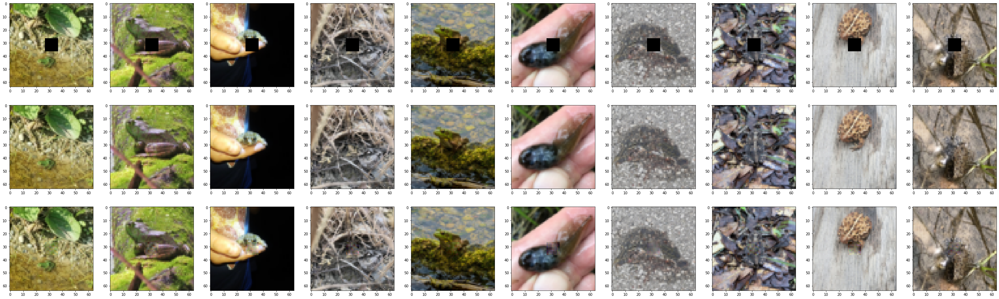

In [ ]:
dilatedgatedgan_results = run_inference(dilatedgatedgan_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.3.1.3 Analysis of results

<p align="center">
  <img src="https://i.ibb.co/4JdLNK6/DGAN-curves.png" />
</p>
<center><i> Training curves. Visualization done via WandB. (Red) BaselineGAN (Blue) DilatedGatedGAN  </i></center>

<p align="center">
  <img src="https://i.ibb.co/3SDbVRy/DGAN-plots.png" />
</p>
<center><i> Generated images.  </i></center>

Qualitatively and quantitatively, we see that the inclusion of dilated and gated convolutions lend a significant improvement to the generated images. 

In particular, we see that the generated images have richer textures and better colour coherence with the surrounding image compared to the baseline models. This improvements - particularly colour coherence - is expected given the use of gated convolutions, which dynamically prevent the propagation of invalid pixel values. 

The simple implementation and significant improvement is why we utilize gated and dilated convolutions for all later models.

However, in some samples, particularly in those that cut across lines, we observe a lack of global consistency (e.g. lines do not connect across masked region). We thus direct our focus towards a joint local and global discriminator - where we use a paired discriminator to encourage local and global consistency.

#### 4.3.2 Local and Global Discriminators

The idea behind local and global discriminators, first proposed for image inpainting by Iizuka et al. [22], is to simply replace the standard discriminator in the GAN architecture with a combination of two discriminators that looks at the inpainted image at different image scales. The global discriminator takes in the entire inpainted image (global context) and is responsible for guiding the generator to inpaint missing pixels in a globally consistent manner. The local discriminator only takes in the generated image patches and is resposible for guiding the generation of finer details by the generator. The outputs of both discriminators are then concatenated together and passed through a fully-connected layer to yield the final combined discriminator output. This is illustrated in the figure below.

<p align="center">
  <img src="https://i.ibb.co/gVDqVsv/local-global-gan-diagram.png" />
</p>
<center><i> Illustration of LocalGlobalGAN architecture</i></center>

##### 4.3.2.1 Model Architecture
Since this technique is an improvement to the discriminator, we keep the generator the same as that defined in the [gated convolutions section](#gated). Instead of using a single 5-layer discriminator like in our previous experiments, we now use two of the same 5-layer discriminators, each with its own input image size.

In [ ]:
class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> down -> same -> down
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x dilated conv
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)

        # 2 x same
        self.conv10 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # up sample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x


class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, hidden_dim)

    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x

class DoubleDiscriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(DoubleDiscriminator, self).__init__()

        self.d1 = Discriminator(input_dim, hidden_dim, input_shape, activation)
        self.d2 = Discriminator(input_dim, hidden_dim, input_shape, activation)
        
        # linear to predict classes
        self.linear = nn.Linear(hidden_dim*2, 1)

    def forward(self, input_tensor1, input_tensor2):
        x1 = self.d1(input_tensor1)
        x2 = self.d2(input_tensor2)
        x = torch.cat([x1, x2], dim = 1)
        x = self.linear(x)

        return x

##### 4.3.2.2 LocalGlobalGAN Results visualisation

In [ ]:
localglobalgan_weights = os.path.join(MODEL_WEIGHTS_PATH, "localglobalgan_generator_epoch20.pt")
localglobalgan_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
localglobalgan_generator.load_state_dict(torch.load(localglobalgan_weights, map_location=device))
print(f"Loaded generator weights from {localglobalgan_weights}.")

summary(localglobalgan_generator)

Loaded generator weights from model_weights/localglobalgan_generator_epoch20.pt.
model has 1.116355 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            33.4518 |       0.000453681 |        0.0557483 |         0.0025013 |          0.30736 |         0.02004 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


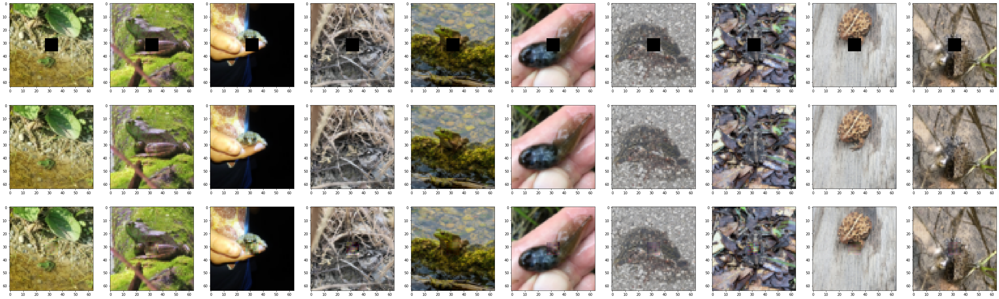

In [ ]:
localglobalgan_results = run_inference(localglobalgan_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.3.2.3 Analysis of results

Qualitatively, we observe better consistency, particularly relating to colour when a local and global discriminator pair is introduced. However, we see significant quantitative regression in the model, with this model performing worse across the board relative to all of the previous GAN models.

Our attempts to visualize the underlying convolution kernels via deconvolution were relatively inconclusive (and so, not included here), but judging by the training curves, we posit that it is likely due to a larger model underfitting, and in particular that and underfitting discriminator provides noisy adversarial feedback. 


An intuitive idea is thus to combine the two - via pixelwise classification.

<p align="center">
  <img src="https://i.ibb.co/9q1XN1n/ILGGAN-train.png" />
</p>
<center><i> Validation curves. Visualization done via WandB. (Red) LocalGlobalGAN (Blue) BaselineGAN  </i></center>

<p align="center">
  <img src="https://i.ibb.co/3sYzPwD/ILGGAN-plots.png" />
</p>
<center><i> Generated images.  </i></center>

#### 4.3.3 PatchGAN Discriminator

A normal discriminator returns a single value from 0 to 1 that represents how real the discriminator thinks the image is. This formulation considers the image as a whole, which might neglect the local texture details of the image. 

Using local and global discriminators helps with this, but [patch-based discrimination](https://arxiv.org/pdf/1611.07004.pdf) goes one step further in this idea. Instead of returning just a single value for the entire input image, a patch-wise discriminator returns a 2-array of values where each location in the 2d-array represents how real the discriminator thinks each input patch of the given image is. This is illustrated in the figure below:

<p align="center">
  <img src="https://i.ibb.co/Ny3tS6H/patchgan-diagram.png" />
</p>
<center><i> Illustration of PatchGAN architecture</i></center>

By discriminating the "realness" with respect to each input image patch as opposed to the entire image, it allows the local texture details of the generated images to be enhanced through more detailed adversarial feedback. 

##### 4.3.3.1 Model Architecture
As with the previous experiment, we keep the generator the same as that defined in the [gated convolutions section](#gated). For the discriminator, we swap out the final fully-connected layer with a convolutional layer so to return a 2D array of "realness" predictions instead of a single value.

In [ ]:
class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> down -> same -> down
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x dilated conv
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)

        # 2 x same
        self.conv10 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation, scale_factor = (2,2))
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # up sample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x

class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        self.final = nn.Conv2d(hidden_dim, 1, kernel_size = 3, stride = 1, padding = 'same')

    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x) + x
        x = self.conv2(x) + x
        x = self.conv3(x) + x
        x = self.conv4(x) + x

        # scores
        x = self.final(x)
        x = torch.sigmoid(x)

        return x

##### 4.3.3.2 PatchGAN Results visualisation

In [ ]:
patchgan_weights = os.path.join(MODEL_WEIGHTS_PATH, "patchgan_generator_epoch20.pt")
patchgan_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
patchgan_generator.load_state_dict(torch.load(patchgan_weights, map_location=device))
print(f"Loaded generator weights from {patchgan_weights}.")

summary(patchgan_generator)

Loaded generator weights from model_weights/patchgan_generator_epoch20.pt.
model has 1.116355 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            35.0264 |       0.000316774 |        0.0389252 |        0.00205053 |         0.251969 |       0.0165137 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


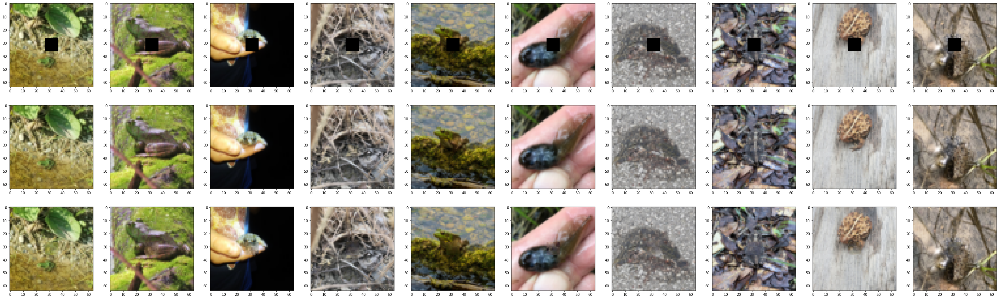

In [ ]:
patchgan_results = run_inference(patchgan_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.3.3.3 Analysis of results

The patch based model is qualitatively and quantitatively the best performing model, achieving good reconstructions even on challenging scenes involving a lot of textures and lines. 

At this point, we have largely focused our attention on efforts to improve adversarial feedback to the generator, so in the following sections, we move on to novel architectural improvements on the generator side. 

<p align="center">
  <img src="https://i.ibb.co/4RMzQm9/PGAN-curves.png" />
</p>
<center><i> Validation curves. Visualization done via WandB. (Red) BaselineGAN (Green) PatchGAN  </i></center>

<p align="center">
  <img src="https://i.ibb.co/wgWckFP/PGAN-plots1.png" width=100%/>
</p>
<p align="center">
  <img src="https://i.ibb.co/bsgLVfP/PGAN-plots2.png" width=100% />
</p>
<center><i> Generated images.  </i></center>


#### 4.3.4 Results of improvement techniques (so far)

| Metric| GAN     | DilatedGatedGan | LocalGlobalGan | PatchGAN |
| ----- | ------- | --------------- | -------------- | -------- |
| L1    | 0.2750​  | 0.2720          | 0.3406          | **0.2520**   |
| L2    | 0.04460​ | 0.04458         | 0.07278       | **0.03893**  |
| LPIPS | 0.01750​ | 0.01694         | 0.02063         | **0.01651**  |
| PSNR  | 34.43​  | 34.44          | 32.32         | **35.03**    |








<center><i>Performance of improvement techniques against the GAN baseline. The best score for each metric is <b>bolded</b>.</i> </center>



### 4.4 Generator-focused improvements

#### 4.4.1 Edge-First Generation

In this section we explore how the use of a multi-task learning architecture can improve the image inpainting task. 

While there have been substantial improvements to the quality of the images generated, we observe that in some instances the generated images are blurry. 

We draw inspiration from [multi-task learning architectures](https://arxiv.org/abs/1706.05098), and force the generator to learn basic structure and edges of images by predicting the grayscale version of the input image first as an auxiliary task. 

Then, this predicted grayscale image is concatenated to the input image and fed in together to another generator to generate the final inpainted image. The idea behind this is to separate the task of image inpainting into two simpler tasks: one to first predict the basic structure of the image by predicting the grayscale image, and the second to predict the final colours of the image given the grayscale image as the image prior [23]. 

Intuitively and empirically, multi-task learning formulations have been shown to improve data efficiency (particularly relevant, given our small dataset), with the idea that auxilliary losses guide the model towards global minima (since the model must do well on a variety of _related_ tasks) [24]. 

We use the L2 loss as the loss function for the auxiliary task of predicting the grayscale image.

<p align="center">
  <img src="https://i.ibb.co/Pwh84Pc/edgegan-v2-diagram.png" />
</p>
<center><i> Illustration of EdgeGAN architecture.</i></center>

##### 4.4.1.1 Model Architecture

We use two generators here: one for grayscale prediction, one for the final prediction. Both generators have the same generator architecture as defined in the [gated convolutions section](#gated). We keep the discriminator the same as defined in the [gated convolutions section](#gated) as well for consistency in comparison.

In [ ]:
class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> downsample -> same -> downsample
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same conv
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x dilated same conv
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)

        # 2 x same conv
        self.conv10 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 2 x up conv for gray (NOT USED TODO)
        self.convgray1 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.convgray2 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')


        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')


    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        
        # downsample
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x

        # dilated conv with residual skips
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x

        # middle layers
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # upsample using gray
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        final = self.final(x)

        return final

class DoubleGenerator(nn.Module):

    def __init__(self, input_dim, hidden_dim, activation):
        super(DoubleGenerator, self).__init__()
        self.g1 = Generator(input_dim, hidden_dim, output_dim = 1, activation = activation)
        self.g2 = Generator(input_dim + 1, hidden_dim, output_dim = 3, activation = activation)

    def forward(self, input_tensor):
        gray = self.g1(input_tensor)
        colour = self.g2(torch.cat([gray, input_tensor], dim = 1))
        return colour, torch.sigmoid(gray)

class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, 1)


    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x

##### 4.4.1.2 EdgeGAN Results visualisation

In [ ]:
edgegan_weights = os.path.join(MODEL_WEIGHTS_PATH, "edgegan_generator_epoch20.pt")
edgegan_generator = DoubleGenerator(input_dim = 4, hidden_dim = 64, activation = nn.Mish)
edgegan_generator.load_state_dict(torch.load(edgegan_weights, map_location=device))
print(f"Loaded generator weights from {edgegan_weights}.")

summary(edgegan_generator)

Loaded generator weights from model_weights/edgegan_generator_epoch20.pt.
model has 2.528644 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            33.9808 |       0.000402019 |        0.0494001 |         0.0023456 |         0.288227 |       0.0187774 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


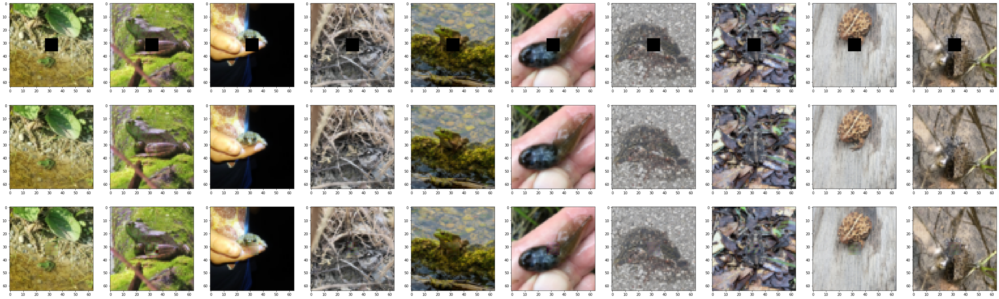

In [ ]:
edgegan_results = run_inference(edgegan_generator, test_dataset=test_dataset, sample_size=10, seed=None, mode=1)

##### 4.4.1.3 Analysis of results

The images and metrics at test time suggest that the edge-first model is performs worse than the baseline GAN models, in particular producing blurry images with strange _textures_. 

We posit that this is in part due to underfitting, since a duplication of the generator also meant a significant increase in model size. 

In particular, though, we hypothesize that the poor performance is amplified due to the multi-task architecture of the model. Multi-task learning relies on the idea that tasks are sufficiently similar that auxilliary losses guide movement towards minima along the manifold, and in the case of a heirarchical model implemented here, that the output of the auxilliary task is in itself helpful for the main task. 


While intuitively, we expect grayscale image prediction to be useful, we observe poor grayscale prediction, with most images generated being very blurry. This might have led to a noisy optimization landscape. So in this way, an underfit grayscale helper model might have worsened reconstruction performance. 
<p align="center">
  <img src="https://i.ibb.co/7Rz8r2Z/EGAN-curves.png" />
</p>
<center><i> Validation curves. Visualization done via WandB. (Red) BaselineGAN (Beige) EdgeGAN  </i></center>

<p align="center">
  <img src="https://i.ibb.co/hMZtnR5/EGAN-plots.png" />
</p>
<p align="center">
  <img src="https://i.ibb.co/jHz7NCX/EGAN-gray.png" />
</p>
<center><i> Gray scale predictions of EdgeGAN architecture.</i></center>

#### 4.4.2 Graph-based image inpainting



##### Why graph neural networks?

We highlight that convolutional neural networks fundamentally rely on convoluton operations - that is, operations that model local correlations. Image inpainting requires large receptive fields to gather sufficient information for infilling the gaps. 

There are two main ways to grow the receptive field of CNN's - by dilating convolutions or using a deeper network. However, the former is only able to model grid-like spatial correlations and are not invariant to non-grid patterns, while there is [evidence](https://proceedings.neurips.cc/paper/2016/file/c8067ad1937f728f51288b3eb986afaa-Paper.pdf) to suggest that the _effective_ receptive field size is smaller than the theoretical when stacking networks.

##### Graph construction - convolution module

Inspired by the work of [Dynamic Attentive Graph Learning for Image Restoration](http://arxiv.org/abs/2109.06620), we implement a graph-based module to model long-range correlations by dynamically predicting an adjacency tensor with a learnable sparsity constraint and use [Graph Isomorphism Network]() convolutions for their expressivity in exploiting graph structure. 

More formally:

1. Given an intermediate feature map $\mathbf{F} \in \mathbb{R}^{C \times H \times W}$, we pass the feature map through a gated convolution to arrive at edge features $\mathbf{F_E}$ of the same dimensions. 

2. We carry out L2 normalization of the pixel features pixelwise, and calculate pair-wise similarities efficiently by flattened dot product to produce a similarity matrix $\mathbf{M} \in \mathbb{R}^{N \times N}$, where $\mathbf{N}$ is the number of pixels. The adjecency tensor is then generated by ${Sigmoid(\mathbf{M})}$.

3. We then generate an learnable threshold for each node (pixel) by an affine transformation of the mean similarity score for a given pixel. That is, for a node ${i}$, we find the mean score in the similarity matrix $\mathbf{M}, {m_i} = \frac{1}{N}\sum_{i =1}^{n} {M_{i,k}} $, then we apply a node-specific affine transformation to compute the threshold ${T_i}$ as follows:

${T_i} = ReLU(\Phi ({F_{E,i}})̇⋅{m_i} + \Gamma({F_{E,i}}))$, where $\Phi$ and $\Gamma$ are linear transformations implemented by ${1 \times 1 \times C}$ convolutions and ${ReLU}$ activation is used to ensure that the thresholds are positive.

Note that this implementation is identical to the implementation in [here](http://arxiv.org/abs/2109.06620) for dynamic graph construction. 

4. We then prune the predicted adjacency matrix with the threshold by deducting the threshold for a given node ${i}$.

5. We then carry out GIN convolutions for message passing, before reshaping the node features back into an image feature map.

Other works referenced in the design of this module:
1. [How Powerful are Graph Neural Networks?](https://arxiv.org/abs/1810.00826)
2. [Design Space for Graph Neural Networks](https://arxiv.org/abs/2011.08843)




##### 4.4.2.1 Model Architecture

In [ ]:
import torch_geometric as torch_g
import torch_geometric.nn as gnn


class GNNBlock(nn.Module):

    def __init__(self, in_channels, out_channels, activation = nn.ReLU):

        super(GNNBlock, self).__init__()
        self.conv = gnn.GINConv(nn.Sequential(nn.Linear(in_channels, out_channels), activation()))
        self.post1 = nn.Sequential(nn.Linear(out_channels, out_channels), activation())
        self.post2 = nn.Sequential(nn.Linear(out_channels, out_channels), activation())

    def forward(self, input_tensor, adj):
        # convert adj to sparse
        device = input_tensor.device
        edge_index, edge_attr = torch_g.utils.dense_to_sparse(adj)
        edge_index = edge_index.long().to(device)
        b, hw, c = input_tensor.shape
        x = input_tensor.reshape(b * hw, c) # (b x hw x c) -> (bhw x c)

        # forward
        x = self.conv(x, edge_index)
        x = self.post1(x)
        x = self.post2(x)

        # reshape back
        x = x.reshape(b, hw, c)
        
        return x


class GatedGraphConvModule(nn.Module):
    """
    This module implements GNN convolution on images using local, global and channel features to predict
    the adjacency tensor.
    """

    def __init__(self, channels, kernel_size, stride, padding, dilation, activation = nn.ReLU):

        super(GatedGraphConvModule, self).__init__()


        # incidence matrix
        self.feature_conv = GatedConv2dBlock(channels, channels, kernel_size = kernel_size, stride = stride, padding = padding, dilation = dilation, activation = activation)
        self.edge_conv = GatedConv2dBlock(channels, channels, kernel_size = kernel_size, stride = stride, padding = padding, dilation = dilation, activation = activation)
        self.scaleconv = GatedConv2d(channels, 1, kernel_size = 1, stride = 1, padding = 0, dilation = 1)
        self.offsetconv = GatedConv2d(channels, 1, kernel_size = 1, stride = 1, padding = 0, dilation = 1)

        # graph conv
        self.gnn1 = GNNBlock(channels, channels, activation = activation)


    def forward(self, input_tensor, return_adj = False,):

        # metadata
        b, c, h, w = input_tensor.shape
        
        # 1. compute features for edge prediction
        edge_features = self.edge_conv(input_tensor)

        # 2. compute adjacency matrix by dot product 
        scores = edge_features.view(b, c, h*w) # reshape and normalize
        scores = nn.functional.normalize(scores, p = 2, dim = 2) # normalize vector at each node
        scores = torch.bmm(scores.permute(0, 2, 1), scores) # (b x hw x c) x (b x c x hw) -> (b x hw x hw)
        adj_tensor = torch.sigmoid(scores)

        # 3. compute dampening factor by affine transformations of mean of edge features
        scale = self.scaleconv(edge_features)
        offset = self.offsetconv(edge_features)
        mean = scores.mean(dim = 1, keepdim = True) # (b x 1 x hw) mean of similarity scores as base
        adjustment = torch.relu(scale.view(b,1,h*w) * mean + offset.view(b,1,h*w)) # relu to keep everything positive

        # dampen
        adj_tensor = adj_tensor - adjustment

        # 4. graph conv
        x = input_tensor.view(b, c, h*w).permute(0, 2, 1)  # -> b x hw x c
        x = self.gnn1(x, adj_tensor) + x # -> b x hw x c

        # 5. reshape back to image
        x = x.permute(0, 2, 1).view(b, c, h, w)

        if return_adj:
            return x, adj_tensor
            
        return x


class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> downsample 
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # same -> downsample
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same conv
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # graph conv
        self.graphconv1 = GatedGraphConvModule(hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x dilated conv
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)

        # 2 x same conv
        self.conv10 = GatedConv2dBlock(2*hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

        # for contrastive learning, 1x1 conv to compress feature map into 1 channel
        self.conv_feature = nn.Conv2d(hidden_dim, 1, kernel_size = 1, stride = 1, padding = 'same')

    def forward(self, input_tensor, return_adj = False):
        
        # downsample
        x = self.conv0(input_tensor)
        x = self.conv1(x)

        # downsample
        x = self.conv2(x)
        x = self.conv3(x)

        # middle preprocessing layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x

        # graph conv
        g, adj = self.graphconv1(x, return_adj = True)
        g = g + x

        # dilated conv with residual skips
        d = self.conv6(x) + x
        d = self.conv7(d) + d
        d = self.conv8(d) + d
        d = self.conv9(d) + d

        # middle postprocessing layers
        x = self.conv10(torch.cat([d,g], dim = 1)) + x
        x = self.conv11(x) + x

        # upsample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        if return_adj:
            return x, adj

        return x


class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, 1)


    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x


##### 4.4.2.2 GraphGAN Results visualisation

In [ ]:
graphgan_weights = os.path.join(MODEL_WEIGHTS_PATH, "graphgan_generator_epoch20.pt")
graphgan_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
graphgan_generator.load_state_dict(torch.load(graphgan_weights, map_location=device))
print(f"Loaded generator weights from {graphgan_weights}.")

summary(graphgan_generator)

Loaded generator weights from model_weights/graphgan_generator_epoch20.pt.
model has 1.350856 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.3257 |       0.000375406 |        0.0461299 |        0.00225082 |         0.276581 |       0.0184011 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


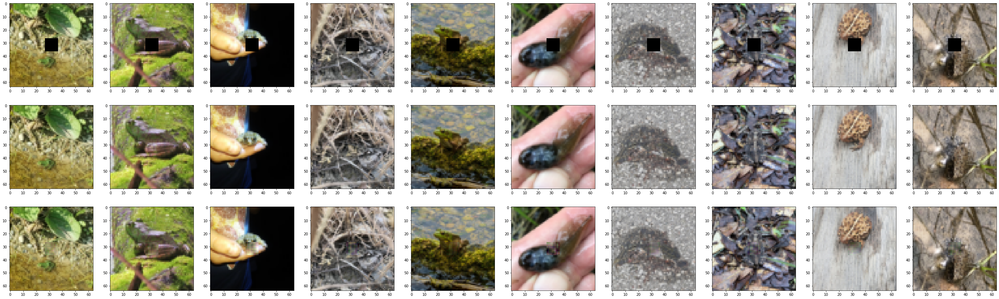

In [ ]:
graphgan_results = run_inference(graphgan_generator, test_dataset=test_dataset, sample_size=10, seed=None)

##### 4.4.2.3 Analysis of results

Qualtitatively, we observe that the model performs better for "hard" images, particularly when the mask is at the corner of an image and context is limited, which aligns with our expectations. A visualization of the predicted adjacency tensors (by number of edges predicted for a given pixel) reveal that the graph convolution module has the ability to dampen and express certain pixel features as needed, which is key to model non-linear long-range correlations.  

The metrics show that the model is quantitatively competitive with the other models, though it falls slightly behind. We also observe some blurring in some images. 

A possible explanation, once more, is underfitting - afterall, this model has almost 30% more parameters compared to the baseline model with just dilated and gated convolutions, but is trained for the same number of epochs. 

We note, however, that the learnable pruning mechanism is key to the good performance of introducing graph convolutions - previous attempts largely led to densely connected graphs and reconstruction results closer to that of the MLP model, which makes intuitive sense (since an MLP really is just a fully connected graph). 

<p align="center">
  <img src="https://i.ibb.co/VVGVqc5/GGAN-results1.png" />
</p>
<p align="center">
  <img src="https://i.ibb.co/kJVt32j/GGAN-results2.png" />
</p>
<center><i> Visualization of interesting long-range correlations modelled by GraphGAN</i></center>



<p align="center">
  <img src="https://i.ibb.co/c8b2sLq/GGAN-curves.png" />
</p>
<center><i> Validation curves. Visualization done via WandB. (Red) BaselineGAN (Brown) GraphGAN  </i></center>


#### 4.4.3 Contrastive learning

Representation learning via contrastive learning has been making waves in the vision community in the recent years for its ability to improve the performance of models across many downstream vision tasks (classification, detection, segmentation, generation) and also its ability to do so without labelled data (self-supervised learning). The core idea behind contrastive learning is to learn a representation function (encoder), via a suitable loss function, that encodes augmentations of the same image together in the latent space, and encodes augmentations of different images far apart in the latent space [25]. This helps the encoder learn better representations of images, which in turn results in improved model performance in downstream tasks.

In our experiments, we empirically observed that identical images with different masks would sometimes lead to inconsistent reconstructions (e.g. not very consistent with surrounging larger context). We addressed this on the discriminator side with local and global and patch discriminators. 

To emulate regularization in this way, we turn our contrastive learning to control the distribution in the latent space. This is achieved by choosing our positive training pairs to be identical images with different masks, and using the l2 loss as our contrastive loss function [26]. We utilize two generators during training, both of which learns the same representation function through the contrastive loss. During inference, either of the generators can be used for image inpainting.

##### 4.4.3.1 Model Architecture

<p align="center">
  <img src="https://i.ibb.co/r5YdSKJ/contrastive-gan-diagram.png" />
</p>
<center><i> Illustration of ContrastiveGAN architecture.</i></center>


We use two generators in ContrastiveGAN, both of which have the same architecture as defined in the [gated convolutions section](#gated). Our discriminator is kept the same as defined in the [gated convolutions section](#gated) as well for consistency in comparison.

In [ ]:
class Generator(nn.Module):

    def __init__(self, input_dim, hidden_dim, output_dim, activation):
        super(Generator, self).__init__()
        
        # same -> downsample -> same -> downsample
        self.conv0 = GatedConv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv1 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv3 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # 2 x same conv
        self.conv4 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv5 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # 4 x dilated conv
        self.conv6 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 2, dilation = 2, activation = activation)
        self.conv7 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 4, dilation = 4, activation = activation)
        self.conv8 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 8, dilation = 8, activation = activation)
        self.conv9 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 16, dilation = 16, activation = activation)

        # 2 x same conv
        self.conv10 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv11 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # upsample -> same -> upsample -> same
        self.conv12 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv13 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)
        self.conv14 = GatedUpConv2dBlock(hidden_dim, hidden_dim, scale_factor = (2,2), kernel_size = 3, stride = 1, padding = 1, dilation = 1, mode = 'nearest')
        self.conv15 = GatedConv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 1, padding = 1, dilation = 1, activation = activation)

        # final
        self.final = nn.Conv2d(hidden_dim, output_dim, kernel_size = 3, stride = 1, padding = 'same')

        # for contrastive learning, 1x1 conv to compress feature map into 1 channel
        self.conv_feature = nn.Conv2d(hidden_dim, 1, kernel_size = 1, stride = 1, padding = 'same')

    def forward(self, input_tensor):

        x = self.conv0(input_tensor)
        
        # downsample
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # middle layers
        x = self.conv4(x) + x
        x = self.conv5(x) + x

        # dilated conv with residual skips
        x = self.conv6(x) + x
        x = self.conv7(x) + x
        x = self.conv8(x) + x
        x = self.conv9(x) + x

        # extract for contrastive loss
        x_feature = self.conv_feature(x)

        # middle layers
        x = self.conv10(x) + x
        x = self.conv11(x) + x

        # upsample
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.conv14(x)
        x = self.conv15(x)
        
        # final
        x = self.final(x)

        return x, x_feature


class Discriminator(nn.Module):

    def __init__(self, input_dim, hidden_dim, input_shape, activation):

        super(Discriminator, self).__init__()

        # 5 layers down
        self.conv0 = Conv2dBlock(input_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv1 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv2 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv3 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)
        self.conv4 = Conv2dBlock(hidden_dim, hidden_dim, kernel_size = 3, stride = 2, padding = 1, dilation = 1, activation = activation)

        # linear to predict classes
        LATENT_H = input_shape//(2**5)
        self.linear = nn.Linear(LATENT_H**2 * hidden_dim, 1)


    def forward(self, input_tensor):
        
        x = self.conv0(input_tensor)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)

        # scores
        x = torch.flatten(x, start_dim = 1)
        x = self.linear(x)

        return x

##### 4.4.3.2 ContrastiveGAN Results visualisation

In [ ]:
contrastivegan_weights = os.path.join(MODEL_WEIGHTS_PATH, "contrastivegan_generator1_epoch20.pt")
contrastivegan_generator = Generator(input_dim = 4, hidden_dim = 64, output_dim = 3, activation = nn.Mish)
state_dict = torch.load(contrastivegan_weights, map_location=device)

# create new OrderedDict that does not contain module.
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
    name = k[7:] # remove module.
    new_state_dict[name] = v
# load params
contrastivegan_generator.load_state_dict(new_state_dict)

print(f"Loaded generator weights from {contrastivegan_weights}.")
summary(contrastivegan_generator)

Loaded generator weights from model_weights/contrastivegan_generator1_epoch20.pt.
model has 1.11642 million parameters


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


+--------------------+-------------------+------------------+-------------------+------------------+-----------------+
|   Peak SnR (Whole) |   L2 loss (Whole) |   L2 loss (Mask) |   L1 loss (Whole) |   L1 loss (Mask) |   LPIPS (Whole) |
|--------------------+-------------------+------------------+-------------------+------------------+-----------------|
|            34.2538 |       0.000377194 |        0.0463496 |        0.00227762 |         0.279874 |       0.0205833 |
+--------------------+-------------------+------------------+-------------------+------------------+-----------------+


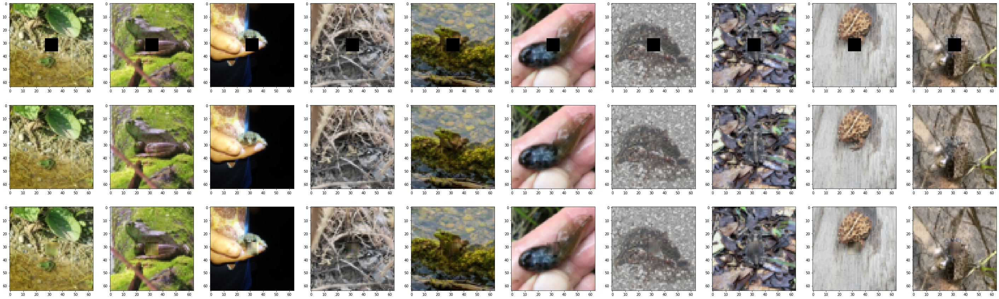

In [ ]:
contrastivegan_results = run_inference(contrastivegan_generator, test_dataset=test_dataset, sample_size=10, seed=None, mode=1)

##### 4.4.3.3 Analysis of results

We observed many strange discolourations and uneven textures in the reconstructions, and quantitiatively this model performs the worse. 

We posit that it is likely due to an incorrect underlying assumption of similarity. Because of the mapping at the level of _sets_ for the image inpainting tasks, images with different masks, despite being the same underlying image, are fundementally different. To constrain them to similar regions in the latent space with contrastive loss likely led to a noisy optimization landscape as a result. The training curves also show that reconstruction performance plateaud as contrastive loss fell, supporting this thesis. 

<p align="center">
  <img src="https://i.ibb.co/28Drh1V/CGAN-plots.png" />
</p>
<center><i> Generated images. </i></center>


<p align="center">
  <img src="https://i.ibb.co/sKhvc46/CGAN-curves.png" />
</p>
<center><i> Validation curves. Visualization done via WandB. (Red) BaselineGAN (Pink) ContrastiveGAN  </i></center>

<p align="center">
  <img src="https://i.ibb.co/Wv18qTW/CGAN-badcurves.png" />
</p>
<center><i> Training curves of contrastive loss and individual generator/discriminator losses. Observe that as contrastive loss decreases, generator optimization becomes noisy. Visualization done via WandB.  </i></center>



#### 4.4.4 Results of generator-focused approaches

| Metric| GAN     | EdgeGAN | GraphGAN | ContrastiveGAN|
| ----- | ------- |  ------- | -------- | -------- |
| L1    | 0.2750  | 0.2882   | **0.2766**  | 0. 2799   |
| L2    | 0.04460 | 0.04940 | **0.04613** | 0.04635  |
| LPIPS | 0.01750​ | 0.01878 | **0.01840**  | 0.02058  |
| PSNR  | 34.43​   | 33.98  | **34.33**   | 34.25   |

<center><i>Performance of improvement techniques against the GAN baseline. The best score for each metric is <b>bolded</b>.</i> </center>

### 4.5 Overall Results & Analysis

| Metric| GAN     | DilatedGatedGan | LocalGlobalGan | PatchGAN | EdgeGAN | GraphGAN | ContrastiveGAN|
| ----- | ------- | --------------- | -------------- | -------- | ------- | -------- | -------- |
| L1    | 0.2750  | 0.2720          | 0.3406          | 0.2520   | 0.2882   | 0.2766   | 0. 2799   |
| L2    | 0.04460 | 0.04458         | 0.07278        | 0.03893  | 0.04940 | 0.04613 | 0.04635  |
| LPIPS | 0.01750​ | 0.01694         | 0.02063         | 0.01651  | 0.01878 | 0.01840  | 0.02058  |
| PSNR  | 34.43​   | 34.44          | 32.32         | 35.03    | 33.98  | 34.33   | 34.25   |



<center><i>Overall performance of all improvement techniques and approaches.</i> </center>


## 5. Conclusions



### 5.1 Insights



#### Discrimination provides powerful feedback for photorealism

In both our baseline and later improvement-focused experiments, we saw that the introduction of a powerful (and later, improved) adversary significantly improved the subjective quality of the generated images. In the baseline model, the introduction of a simple discriminator significantly improved the autoencoder model (used as the generator) by pushing the model to generate realistic textures, rather than "cheat" by generating smooth images. 

In the later experiements, we also saw that the local, glocal and patch discriminators significantly improved reconstruction quality, more so than the proposed improvements to the generators. 



#### Does this mean generator improvements are pointless? No, they just need more time.

There is significant evidence showing that GANs are the dominant architecture over their non-adversarial counterparts due to powerful adversarial feedback. Most active research focuses on improving the discrimination techniques, while generator-side improvements focus more on increasing model expressiveness. Examples include the introduction of attention-based mechanisms, and the like. 

In our experiments we particularly focused on novel improvements in an effort to test our theoretical understanding, and despite their poorer performance, a common trend was the likelihood of being underfit due to higher model complexity (which innately comes with increasing model expressiveness). To that end, therefore, we suggest that the results might be different given longer training times and more resources.

### 5.2 Learning Points



#### An engineering challenge in tracking experiments 

A repeated experience in this project was the struggle with collaboration and versioning of datasets and models. Tools like GitHub are not designed for machine learning workflows, and sharing jupyter notebooks is a poor choice of sharing information, particularly in a team setting. 

Our team, however, found some success with the use of tools like [WandB](https://wandb.ai/home) for experiment tracking and GitHub for code versioning. 



#### Garbage in, garbage out

At the earlier parts of the project, there was a great struggle with model performance, in large parts due to the issues with the dataset pointed out in the section of data cleaning. It reflects to us that ultimately, a model fits to the distribution of data it is provided - it is not magic, it is not a black box - and if it is given unclean or noisy data, optimization performance will be poor. I think we have a newfound appreciation for good, clean data.



#### Realization of theory 

This project pushed our team to deeply understand the theory of generative models, and the more practical exercise of training, tuning and experimenting with them. It was extremely rewarding. 

### 5.3 Future Work


#### Score based generative models 

Given more time, we would have loved to explore [score-based generative models](https://arxiv.org/abs/2011.13456), a class of generative models recently shown to achieve state of the art performance on image generation tasks with explicit models of a probability distribution, something that neither variational autoencoders or GANs have. 



#### Ablation study of modules 

Given more time, we would have liked to direct resources into training models that combine our findings - that is, a model with a graph convolution module and patch based discrimination, for example - in various permutations, to observe how these modules interact and perhaps glean more insight on how they work beyond the black box of repeated non-linear transforms. 



#### Theoretical examination of our models

Deep neural networks are notoriously challenging to understand due to their complexity, and as a result over the years various techniques have been proposed to better understand them. [Deconvolution](https://arxiv.org/abs/1905.11926), [gradient-based visualization](https://arxiv.org/abs/1610.02391#:~:text=Our%20approach%20%2D%20Gradient%2Dweighted%20Class,image%20for%20predicting%20the%20concept.)  and [counterfactuals](https://arxiv.org/abs/1807.08024) are three techniques in particular that have been shown to reveal interesting behaviours of trained models and reflect their underlying mechanisms. Given more time, we would have liked to implement these. 

## 6. Contributions
All team members contributed greatly to this project. 

### Contributions by all members
* Dataset pulling, cleaning, preprocecessing. 
* Report writing

### Yuan Bo
* Extra contribution in writing of the final report 
* Extra contribution in implementation of the models with improved discriminators

### Chetwin 
* Extra contribution in writing of the final report 
* Extra contribution in implementation of the models with improved discriminators

### Naaman
* Extra contribution in implementation of the baseline models
* Extra contribution in implementation of the models with improved generators
* Extra contribution in preparing the slide deck/video

## 7. References

[1] Z. Qin, Q. Zeng, Y. Zong, and F. Xu, “Image inpainting based on deep learning: A review,” Displays, vol. 69, p. 102028, 2021.

[2] Y. Pang, J. Lin, T. Qin and Z. Chen, "Image-to-Image Translation: Methods and Applications," in IEEE Transactions on Multimedia, doi: 10.1109/TMM.2021.3109419.
“INaturalist,” iNaturalist. [Online]. Available: https://www.inaturalist.org/. [Accessed: 06-Mar-2022]. 

[3] Z.Wang,E.Simoncelli, and A.Bovik,“Multiscale structural similarity for image quality assessment,”in The Thirty-Seventh Asilomar Conference on Signals, Systems Computers, 2003, vol. 2, pp. 1398–1402 Vol.2, 2003.

[4] A. Horé and D. Ziou, “Image quality metrics: Psnr vs. ssim,” in 2010 20th International Conference on Pattern Recognition, pp. 2366–2369, 2010.

[5] R. Zhang, P. Isola, A. A. Efros, E. Shechtman, and O. Wang, “The unreasonable effectiveness of deep features as a perceptual metric,” in CVPR, 2018.

[6] P. Isola, J.-Y. Zhu, T. Zhou, and A. A. Efros, “Image-to-image translation with conditional adversarial networks,” in Computer Vision and Pattern Recognition (CVPR), 2017 IEEE Conference on, 2017.

[7] S. Iizuka, E. Simo-Serra, and H. Ishikawa, “Globally and Locally Consistent Image Completion,” ACM Transactions on Graphics (Proc. of SIGGRAPH), vol. 36, no. 4, pp. 107:1–107:14, 2017.

[8] J. Yu, Z. Lin, J. Yang, X. Shen, X. Lu, and T. S. Huang, “Generative image inpainting with contextual attention,” arXiv preprint arXiv:1801.07892, 2018.

[9] J.Yu,Z.Lin,J.Yang,X.Shen,X.Lu,andT.S.Huang,“Free-form image inpainting with gated convolution,” arXiv preprint arXiv:1806.03589, 2018.

[10] Reimers, N. and Gurevych, I., 2019. Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks. [online] arXiv.org. Available at: <https://arxiv.org/abs/1908.10084>.

[11] Pathak, D., Krahenbuhl, P., Donahue, J., Darrell, T. and Efros, A., 2016. Context Encoders: Feature Learning by Inpainting. [online] arXiv.org. Available at: <https://arxiv.org/abs/1604.07379>.

[12] Misra, D., 2019. Mish: A Self Regularized Non-Monotonic Activation Function. [online] arXiv.org. Available at: <https://arxiv.org/abs/1908.08681>.

[13] He, K., Zhang, X., Ren, S. and Sun, J., 2015. Deep Residual Learning for Image Recognition. [online] arXiv.org. Available at: <https://arxiv.org/abs/1512.03385>.

[14] Li, H., Xu, Z., Taylor, G. and Goldstein, T., 2018. Visualizing the Loss Landscape of Neural Nets. [online] OpenReview. Available at: <https://openreview.net/forum?id=HkmaTz-0W>.

[15] Odena, A., Dumoulin, V. and Olah, C., 2016. Deconvolution and Checkerboard Artifacts. [online] distill. Available at: <https://distill.pub/2016/deconv-checkerboard/>.

[16] Goodfellow, I., Pouget-Abadie, J., Mirza, M., Xu, B., Warde-Farley, D., Ozair, S., Courville, A. and Bengio, Y., 2014. Generative Adversarial Networks. [online] arXiv.org. Available at: <https://arxiv.org/abs/1406.2661>.

[17] Demir, U. and Unal, G., 2018. Patch-Based Image Inpainting with Generative Adversarial Networks. [online] arXiv.org. Available at: <https://arxiv.org/abs/1803.07422>.

[18] Yu, F. and Koltun, V., 2015. Multi-Scale Context Aggregation by Dilated Convolutions. [online] arXiv.org. Available at: <https://arxiv.org/abs/1511.07122>.

[19] Araujo, A., Norris, W. and Sim, J., 2019. Computing Receptive Fields of Convolutional Neural Networks. [online] distill. Available at: <https://distill.pub/2019/computing-receptive-fields/>.

[20] Liu, G., Reda, F., Shih, K., Wang, T., Tao, A. and Catanzaro, B., 2018. Image Inpainting for Irregular Holes Using Partial Convolutions. [online] arXiv.org. Available at: <https://arxiv.org/abs/1804.07723>.

[21] Yu, J., Lin, Z., Yang, J., Shen, X., Lu, X. and Huang, T., 2018. Free-Form Image Inpainting with Gated Convolution. [online] arXiv.org. Available at: <https://arxiv.org/abs/1806.03589>.

[22] IIZUKA, S., SIMO-SERRA, E. and ISHIKAWA, H., 2017. Globally and Locally Consistent Image Completion. [online] tsukuba. Available at: <http://iizuka.cs.tsukuba.ac.jp/projects/completion/data/completion_sig2017.pdf>.

[23] Nazeri, K., Ng, E., Joseph, T., Qureshi, F. and Ebrahimi, M., 2019. EdgeConnect: Generative Image Inpainting with Adversarial Edge Learning. [online] arXiv.org. Available at: <https://arxiv.org/abs/1901.00212>.

[24]  Crawshaw, M., 2020.  MULTI-TASK LEARNING WITH DEEP NEURAL NETWORKS: A SURVEY. [online] arXiv.org. Available at: <https://arxiv.org/pdf/2009.09796.pdf>.

[25]  Saunshi, N., Ash, J., Goel, S., Misra, D., Arora, S., Kakade, S., Krishnamurthy, A., Zhang, C., 2022.  Understanding Contrastive Learning Requires Incorporating Inductive Biases. [online] arXiv.org. Available at: <https://arxiv.org/pdf/2202.14037.pdf>.

[26] Ma, X., Zhou, X., Huang, H., Chai, Z., Wei, X. and He, R., 2020. Free-Form Image Inpainting via Contrastive Attention Network. [online] arXiv.org. Available at: <https://arxiv.org/abs/2010.15643>.

[27] V. Dumoulin και F. Visin, ‘A guide to convolution arithmetic for deep learning’, ArXiv e-prints, Μαρτίου 2016.